In [10]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib import colors
import matplotlib
import seaborn as sns
import cartopy.crs as ccrs
import gpflow
import tensorflow as tf
import glob
from xskillscore import crps_gaussian
from scipy.stats import ttest_ind_from_stats as ttest
#from utils_GP import *
import pandas as pd
from mpl_toolkits.basemap import Basemap, addcyclic

In [122]:
def lat_weighted_mean(x):
    weights = np.cos(np.deg2rad(x.lat))
    return x.weighted(weights).mean(['lat', 'lon'])


def significant_CI(mean, std, ci=0.95):
    """
    Determine if zero lies outside the credible interval for GP predictions.

    Parameters
    ----------
    mean : array-like
        Posterior mean predictions.
    std : array-like
        Posterior standard deviations.
    ci : float, optional
        Credible interval level (default=0.95).

    Returns
    -------
    is_significant : np.ndarray (bool)
        True where zero is outside the credible interval.
    """
    mean = np.asarray(mean)
    std = np.asarray(std)

    # For a Gaussian posterior, 95% CI corresponds to ±1.96 sigma
    z = abs(np.percentile(np.random.randn(1000000), (1 + ci) / 2 * 100)) 
    
    lower_bound = mean - z * std
    upper_bound = mean + z * std

    is_significant = (lower_bound > 0) | (upper_bound < 0)

    return is_significant




# Figure 1: zonal mean temperature change for all NorESM training data

In [123]:
#load training data

def add_year(ds):
    #add experiment ID as a variable:
    print(ds.encoding['source'])
    print(ds.attrs)
    ds = ds.assign_coords(experiment = ds.attrs['experiment_id'])

    # fix some experiment IDs for plotting clarity:
    if 'ssp126-ssp370' in ds.attrs['experiment_id']:
        ds = ds.assign_coords(experiment = 'RAMIP global')
    if 'hist-aer' in ds.attrs['experiment_id']:
        ds = ds.assign_coords(experiment = 'DAMIP hist-aer')
    if 'ssp245-aer' in ds.attrs['experiment_id']:
        ds = ds.assign_coords(experiment = 'DAMIP ssp245-aer')
    if 'RAMIP AF' in ds.attrs['experiment_id']:
        ds = ds.assign_coords(experiment = 'RAMIP AFR')
    if 'RAMIP SA' in ds.attrs['experiment_id']:
        ds = ds.assign_coords(experiment = 'RAMIP SAS')
    if 'RAMIP EA' in ds.attrs['experiment_id']:
        ds = ds.assign_coords(experiment = 'RAMIP EAS')

    #add year as a coordinate to the dataset if it doesn't exist (ie for equilibrium runs where year is not a coordinate)
    if 'year' in ds.coords:
        return ds
    else:
        ds = ds.assign_coords(year=9999)
        ds = ds.expand_dims('year')
        return ds

inputs_ALL = xr.open_mfdataset('../training_data_v2/inputs_*.nc',combine='nested',concat_dim='year',preprocess=add_year)
outputs_ALL = xr.open_mfdataset('../training_data_v2/outputs_*.nc',combine='nested',concat_dim='year',preprocess=add_year)

c:\Users\made2928\OneDrive\Documents\MISU\AeroGP\training_data_v2\inputs_0xEA_SO2.nc
{'units': 'Tg/yr', 'experiment_id': '0xEA SO2 only'}
c:\Users\made2928\OneDrive\Documents\MISU\AeroGP\training_data_v2\inputs_0xEU_SO2.nc
{'emission units': 'Tg/yr', 'experiment_id': '0xEU SO2 only'}
c:\Users\made2928\OneDrive\Documents\MISU\AeroGP\training_data_v2\inputs_0xNA_SO2.nc
{'units': 'Tg/yr', 'experiment_id': '0xNA SO2 only'}
c:\Users\made2928\OneDrive\Documents\MISU\AeroGP\training_data_v2\inputs_0xSA_SO2.nc
{'units': 'Tg/yr', 'experiment_id': '0xSA SO2 only'}
c:\Users\made2928\OneDrive\Documents\MISU\AeroGP\training_data_v2\inputs_10xEU_BC.nc
{'units': 'Tg/yr', 'experiment_id': '10xEU BC only'}
c:\Users\made2928\OneDrive\Documents\MISU\AeroGP\training_data_v2\inputs_10xNA_BC.nc
{'units': 'Tg/yr', 'experiment_id': '10xNA BC only'}
c:\Users\made2928\OneDrive\Documents\MISU\AeroGP\training_data_v2\inputs_10xSA_BC.nc
{'units': 'Tg/yr', 'experiment_id': '10xSA BC only'}
c:\Users\made2928\OneDriv

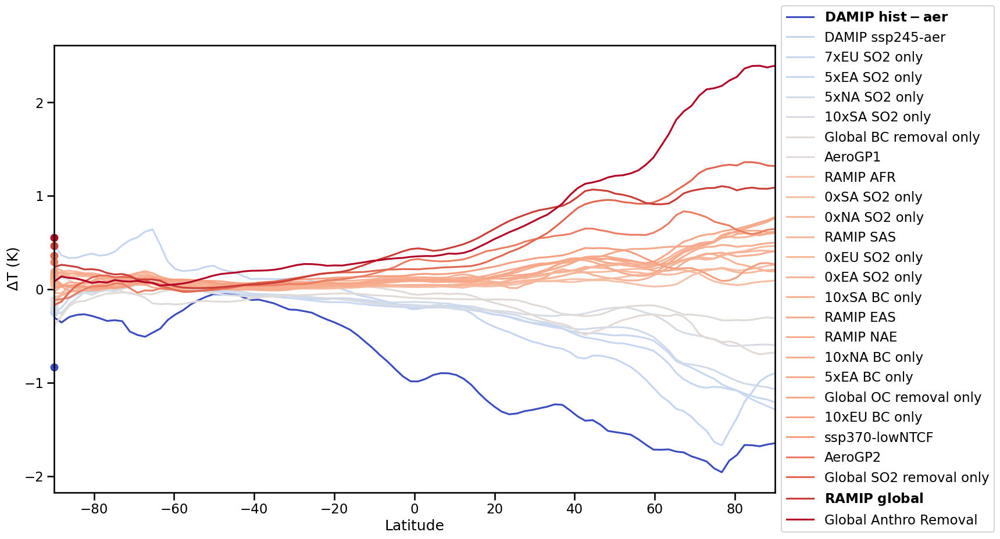

In [125]:
#plot of zonal mean tas_diff of last X years for each experiment:

#time slice to plot:
year_slice = slice(-20,None)

#experiment names:
exps = np.unique(inputs_ALL.experiment)

#pick colors based on global mean tas ranking:
glb_tas20 = xr.DataArray(None, coords=[range(len(exps))], dims=['experiment'])
for ii in range(len(exps)):
    glb_tas20[ii] = lat_weighted_mean(outputs_ALL.where(outputs_ALL.experiment==exps[ii], drop=True)['tas_diff'].isel(year=year_slice).mean('year')) 

#sort global mean tas for nice colours:
glb_tas20_sorted = glb_tas20.sortby(glb_tas20)
norm_tas=((2*(glb_tas20-glb_tas20.min())/(glb_tas20.max()-glb_tas20.min()))-1)

#pick colors based on global mean tas ranking:
norm = colors.CenteredNorm()
norm_vals = norm(tuple(norm_tas.astype(float)))
cmap = matplotlib.cm.coolwarm(norm_vals)

with sns.plotting_context('talk'):
    fig, ax = plt.subplots(1, 1, figsize=(20, 10))
    for ii in glb_tas20_sorted.experiment:
        if exps[ii] in ['DAMIP hist-aer','RAMIP global']:
             text = exps[ii].replace(" ", "\ ")
             label = r"$\bf{" + text + "}$"
        else:
             label = exps[ii]
        zonal_mean = outputs_ALL.where(outputs_ALL.experiment==exps[ii], drop=True)['tas_diff'].isel(year=year_slice).mean('year').mean('lon')
        plt.plot(zonal_mean.lat, zonal_mean, color=cmap[ii], label=label)
        plt.plot(-90,glb_tas20[ii],color=cmap[ii],marker='o',clip_on=False)
    plt.xlabel('Latitude')
    plt.ylabel(r'$\Delta$T (K)')
    #plt.title('Zonal mean temperature change (last 20 years)')
    plt.autoscale(enable=True, axis='x', tight=True)

    ax=plt.gca()
    # Shrink current axis by 20%
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    # Put a legend to the right of the current axis
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))


## Scatter plot of training data (global mean temperature change vs emission change)

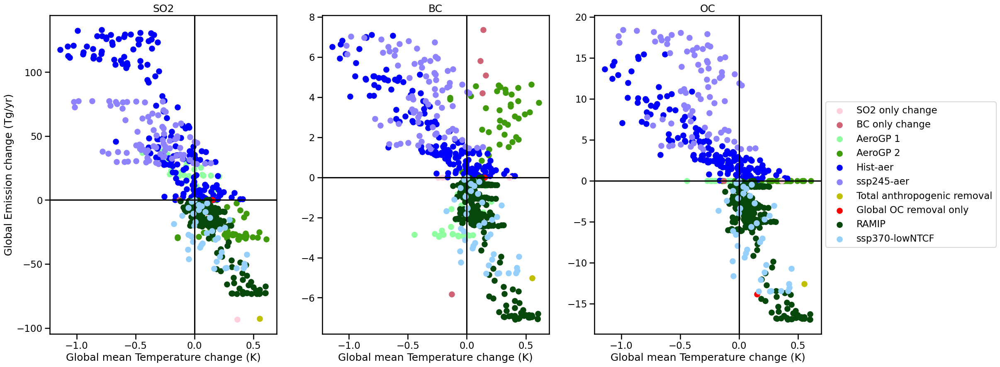

In [127]:
#scatter plot of input data (tas_diff) vs emission change:

with sns.plotting_context('talk'):
    fig, ax = plt.subplots(1, 3, figsize=(24, 10))

    for ii in range(len(exps)):
        #set plot color and label based on experiment type (for simpler legend)
        if 'SO2 only' in exps[ii]:
            col = 'xkcd:pale pink'
            label = 'SO2 only change'
        elif 'Global SO2' in exps[ii]:
            col = 'xkcd:pale pink'
            label = 'SO2 only change'
        elif 'BC only' in exps[ii]:
            col = 'xkcd:rose'
            label = 'BC only change'
        elif 'Global BC' in exps[ii]:
            col = 'xkcd:rose'
            label = 'BC only change'
        elif 'RAMIP' in exps[ii]:
            col = 'xkcd:forest green'
            label = 'RAMIP'
        elif 'Global Anthro' in exps[ii]:
            col = 'y'
            label = 'Total anthropogenic removal'
        elif 'hist-aer' in exps[ii]:
            col = 'b'
            label = 'Hist-aer'
        elif 'ssp245-aer' in exps[ii]:
            col = 'xkcd:periwinkle'
            label = 'ssp245-aer'
        elif '370' in exps[ii]:
            col = 'xkcd:light blue'
            label = 'ssp370-lowNTCF'
        elif 'AeroGP1' in exps[ii]:
            col = 'xkcd:mint green'
            label = 'AeroGP 1'
        elif 'AeroGP2' in exps[ii]:
            col = 'xkcd:grass green'
            label = 'AeroGP 2'
        else:
            label = exps[ii]
            col = 'r'

        ax[0].scatter(lat_weighted_mean(outputs_ALL.where(outputs_ALL.experiment==exps[ii], drop=True)['tas_diff']), inputs_ALL.where(inputs_ALL.experiment==exps[ii], drop=True)['SO2'].sum(['lat','lon']), label=label, color=col)
        ax[1].scatter(lat_weighted_mean(outputs_ALL.where(outputs_ALL.experiment==exps[ii], drop=True)['tas_diff']), inputs_ALL.where(inputs_ALL.experiment==exps[ii], drop=True)['BC'].sum(['lat','lon']), label=label, color=col)
        ax[2].scatter(lat_weighted_mean(outputs_ALL.where(outputs_ALL.experiment==exps[ii], drop=True)['tas_diff']), inputs_ALL.where(inputs_ALL.experiment==exps[ii], drop=True)['OC'].sum(['lat','lon']), label=label, color=col)

    for ii in range(3):
        ax[ii].axvline(x=0,color='k')
        ax[ii].axhline(y=0,color='k')
        ax[ii].set_xlabel('Global mean Temperature change (K)')
        ax[ii].set_title(['SO2','BC','OC'][ii])
        ax[ii].set_xticks(np.arange(-1.0, 1.0, 0.5))

    ax[0].set_ylabel('Global Emission change (Tg/yr)')

    ax=plt.gca()
    # Put a legend to the right of the current axis
    handles, labels = ax.get_legend_handles_labels()
    unique = [(h, l) for i, (h, l) in enumerate(zip(handles, labels)) if l not in labels[:i]]
    ax.legend(*zip(*unique),loc='center left', bbox_to_anchor=(1, 0.5))




## maps of range of perturbations for each species:        


In [43]:
np.unique(inputs_ALL.experiment)

array(['0xEA SO2 only', '0xEU SO2 only', '0xNA SO2 only', '0xSA SO2 only',
       '10xEU BC only', '10xNA BC only', '10xSA BC only',
       '10xSA SO2 only', '5xEA BC only', '5xEA SO2 only', '5xNA SO2 only',
       '7xEU SO2 only', 'AeroGP1', 'AeroGP2', 'DAMIP hist-aer',
       'DAMIP ssp245-aer', 'Global Anthro Removal',
       'Global BC removal only', 'Global OC removal only',
       'Global SO2 removal only', 'RAMIP AFR', 'RAMIP EAS', 'RAMIP NAE',
       'RAMIP SAS', 'RAMIP global', 'ssp370-lowNTCF'], dtype='<U23')

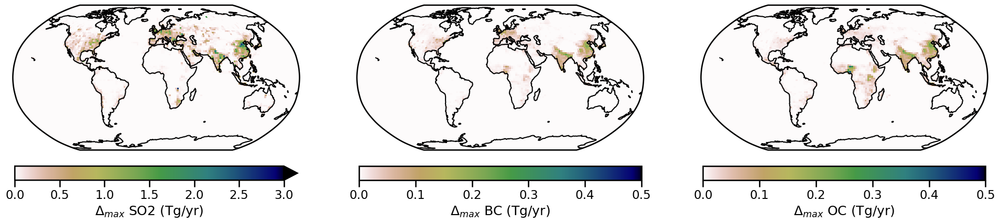

In [128]:
#test = 'Global Anthro Removal'
SO2_range =  inputs_ALL.SO2.max(axis=[0]) - inputs_ALL.SO2.min(axis=[0])
BC_range = inputs_ALL.BC.max(axis=[0]) - inputs_ALL.BC.min(axis=[0])
OC_range = inputs_ALL.OC.max(axis=[0]) - inputs_ALL.OC.min(axis=[0])

proj = ccrs.Robinson()
with sns.plotting_context('talk'):
    fig, ax = plt.subplots(1, 3, figsize=(24, 10), subplot_kw={'projection':proj})

    for ii in range(3):
        if ii == 0:
            title = 'SO2'
            range_ = SO2_range
            vmax = 3.0
        elif ii == 1:
            title = 'BC'
            range_ = BC_range
            vmax = 0.5
        else:
            title = 'OC'
            range_ = OC_range
            vmax = 0.5

        ax[ii].set_title(title)
        im = range_.plot(ax=ax[ii], transform=ccrs.PlateCarree(), cmap='gist_earth_r', vmin=0, vmax=vmax, cbar_kwargs={"label":"$\Delta_{max}$ "+title+" (Tg/yr)",'pad':0.04,'fraction':0.035, 'orientation':'horizontal'})
        ax[ii].coastlines()
            

# Figure 2: Mean significant NorESM signal compared to AeroGP NRMSE

In [129]:
#load dataframes with metrics from csv:
stats_df = pd.read_csv('figure2_stats_lr_v2.csv')

In [130]:
stats_df.sort_values(by='NRMSE')

,Experiment,NorESM mean sig. area (%),NRMSE,ECE,CRPS,Mean Bias,ΔT NorESM (K),ΔT AeroGP (K),NorESM version
23,RAMIP T1,68.075094,0.466109,0.351466,0.363675,-0.028969,0.465549,0.436580,NorESM2
24,DAMIP ssp245-aer,47.489973,0.518959,0.182919,0.167186,0.089490,-0.583240,-0.493750,NorESM2
18,DAMIP hist-aer,77.412817,0.520561,0.108443,0.465151,0.169555,-0.835306,-0.665751,NorESM2
20,RAMIP EA,16.413241,0.603544,0.436994,0.353740,-0.010290,0.129868,0.119578,NorESM2
14,Global Anthro Removal,80.451176,0.664565,0.143599,0.317783,0.015089,0.552782,0.567871,NorESM1
17,Global SO2 removal only,69.757327,0.675585,0.220293,0.310886,0.080041,0.362165,0.442206,NorESM1
11,7xEU SO2 only,66.839297,0.740798,0.289794,0.303566,0.017162,-0.246013,-0.228851,NorESM1
2,0xNA SO2 only,12.112623,0.750008,0.429101,0.271475,-0.002772,0.077350,0.074579,NorESM1
0,0xEA SO2 only,20.565526,0.768470,0.417366,0.281818,-0.040282,0.109757,0.069476,NorESM1
5,10xNA BC only,34.446421,0.776151,0.404200,0.285993,0.001692,0.133683,0.135376,NorESM1


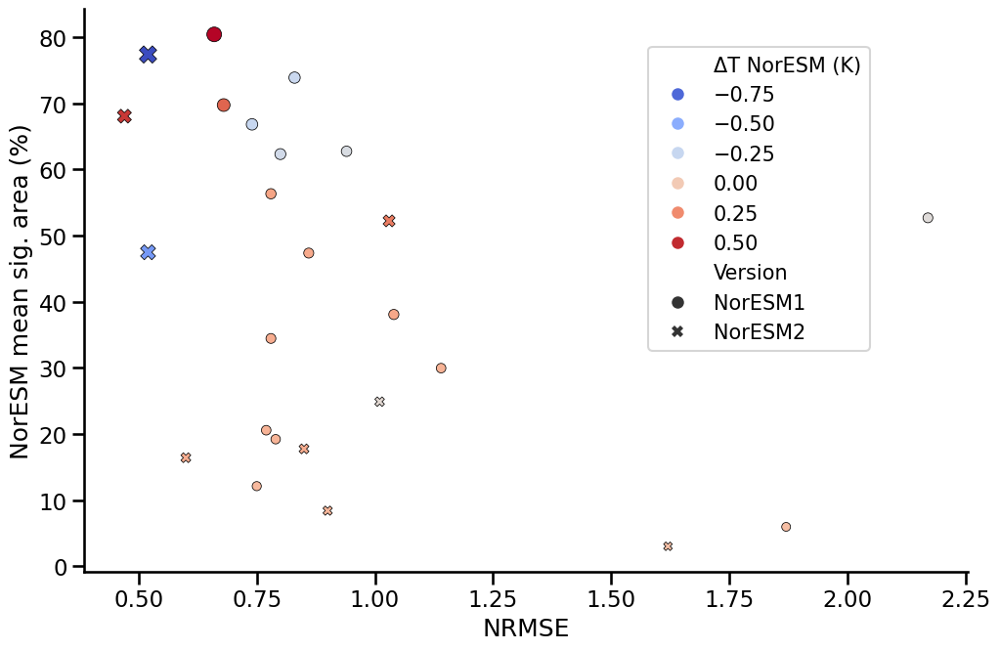

In [131]:
#add absolute value of ΔT NorESM for size of points:
stats_df['abs ΔT NorESM (K)'] = stats_df['ΔT NorESM (K)'].abs()
#rename NorESM version for clarity:
stats_df['Version'] = stats_df['NorESM version']

pal = sns.diverging_palette(10, 260, sep=10, center="light", as_cmap=True)

with sns.plotting_context('talk'):
    g = sns.relplot(x='NRMSE',y='NorESM mean sig. area (%)',hue='ΔT NorESM (K)', size='abs ΔT NorESM (K)', style='Version', data=stats_df[0:-1].round(2), palette='coolwarm', height=7, aspect=1.5,  edgecolor='k')
    handles, labels = g.ax.get_legend_handles_labels()
    g._legend.remove()
    g.ax.legend(handles[0:-6], labels[0:-6], loc='upper right', bbox_to_anchor=(0.90, 0.95),ncol=1, fontsize='small')
 


# Figure 3: comparison maps of NorESM, AeroGP, and difference for RAMIP T1 and hist-aer

In [132]:
#map of RAMIP t1 and DAMIPT hist-aer performance:

#load data:
histaer_NorESM = xr.open_dataset('../training_data_v2/outputs_hist-aer.nc')
#histaer_AeroGP = xr.open_dataset('../logs/logs_hist-aer/posterior_predictY_hist-aer_20250226-151807.nc')
histaer_AeroGP = xr.open_dataset('../logs/lr_v2/hist-aer/posterior_predictY_hist-aer_20250806-230000.nc')
#histaer_AeroGP = xr.open_dataset('../logs/testing/hist-aer multivar/posterior_predictY_hist-aer_20250327-115525.nc')
histaer_stats = xr.open_dataset('../NorESM_stat_data/stats_fdc_hist-aer.nc')

ramip_NorESM = xr.open_dataset('../training_data_v2/outputs_ramip_t1.nc')
#ramip_AeroGP = xr.open_dataset('../logs/logs_RAMIP T1/posterior_predictY_ramip_t1_20250226-195830.nc')
ramip_AeroGP = xr.open_dataset('../logs/lr_v2/RAMIP T1/posterior_predictY_ramip_t1_20250807-021535.nc')
ramipt1_stats = xr.open_dataset('../NorESM_stat_data/stats_fdc_ramip_t1.nc')

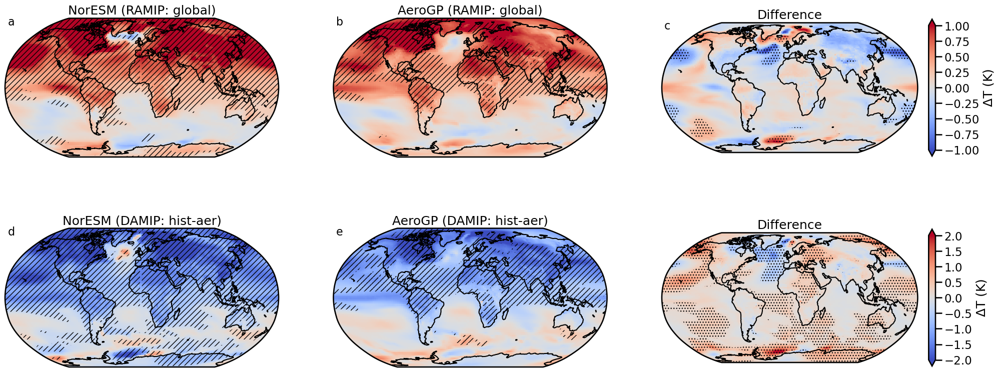

In [133]:
#select years:
histaer_plt_yrs = slice(1995,2014)
ramip_plt_yrs = slice(2050,2059)

histaer_NorESM_mean = histaer_NorESM['tas_diff'].sel(year=histaer_plt_yrs).mean('year')
histaer_AeroGP_mean = histaer_AeroGP['posterior'].sel(year=histaer_plt_yrs).mean('year')
ramip_NorESM_mean = ramip_NorESM['tas_diff'].sel(year=ramip_plt_yrs).mean('year')
ramip_AeroGP_mean = ramip_AeroGP['posterior'].sel(year=ramip_plt_yrs).mean('year')

#differences:
hist_aer_diff = histaer_AeroGP_mean - histaer_NorESM_mean
ramip_diff = ramip_AeroGP_mean - ramip_NorESM_mean

#standard deviation of AeroGP:
hist_gp_std = np.sqrt(np.power(histaer_AeroGP['posterior std'].sel(year=histaer_plt_yrs),2).mean('year'))
ramip_gp_std = np.sqrt(np.power(ramip_AeroGP['posterior std'].sel(year=ramip_plt_yrs),2).mean('year'))

#standard deviation of NorESM:
hist_nor_std = np.sqrt(histaer_NorESM['diff_var'].sel(year=histaer_plt_yrs).mean('year'))
ramip_nor_std = np.sqrt(ramip_NorESM['diff_var'].sel(year=ramip_plt_yrs).mean('year'))

#NorESM p-values:
hist_pvals = histaer_stats['fdr_adjusted_p_values'][0]
ramip_pvals = ramipt1_stats['fdr_adjusted_p_values'][0]

#p_values for differences:
z_em,p_histdiff = ttest(histaer_NorESM_mean, hist_nor_std, 20, histaer_AeroGP_mean, hist_gp_std, 20, equal_var=False, alternative='two-sided')
z_em,p_ramipdiff = ttest(ramip_NorESM_mean, ramip_nor_std, 20, ramip_AeroGP_mean, ramip_gp_std, 20, equal_var=False, alternative='two-sided')

#where AeroGP signal is robust:
#histaer_AeroGP_robust = histaer_AeroGP_mean.where(significant_CI(histaer_AeroGP_mean, hist_gp_std)) 
histaer_AeroGP_robust = histaer_AeroGP_mean.where(significant_CI(histaer_AeroGP['posterior'].sel(year=histaer_plt_yrs), histaer_AeroGP['posterior std'].sel(year=histaer_plt_yrs)).any(axis=0))
#ramip_AeroGP_robust = ramip_AeroGP_mean.where(significant_CI(ramip_AeroGP_mean, ramip_gp_std, ci=0.75))
ramip_AeroGP_robust = ramip_AeroGP_mean.where(significant_CI(ramip_AeroGP['posterior'].sel(year=ramip_plt_yrs), ramip_AeroGP['posterior std'].sel(year=ramip_plt_yrs), ci=0.68).any(axis=0))


divnorm1 = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)
divnorm2 = colors.TwoSlopeNorm(vmin=-2., vcenter=0., vmax=2.)

proj = ccrs.Robinson()

with sns.plotting_context("talk"):
    ## Truth
    fig = plt.figure(figsize=(24, 10))
 
    plt.subplot(231, projection=proj)
    ramip_NorESM_mean.plot(transform=ccrs.PlateCarree(central_longitude=0.0),cmap="coolwarm", norm=divnorm1, add_colorbar=False)
    #plt.pcolor(ramip_NorESM.lon, ramip_NorESM.lat, ramip_pvals, hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.contourf(ramip_NorESM.lon, ramip_NorESM.lat, ramip_pvals, colors='none', levels=[0,0.05],
                    hatches=['///'], alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='NorESM (RAMIP: global)')
    plt.gca().set_ylabel('RAMIP')
    plt.gca().annotate('a', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    # Emulator
    plt.subplot(232, projection=proj)
    ramip_AeroGP_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm1, add_colorbar=False)
    plt.pcolor(ramip_AeroGP_robust.lon, ramip_AeroGP_robust.lat, ramip_AeroGP_robust, hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='AeroGP (RAMIP: global)')
    plt.gca().annotate('b', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    # Difference
    plt.subplot(233, projection=proj)
    ramip_diff.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm1, cbar_kwargs={"label":"$\Delta$T (K)",'pad':0.04,'fraction':0.025})
    cs = plt.contourf(ramip_NorESM.lon, ramip_NorESM.lat, p_ramipdiff, colors='none', levels=[0,0.05],
                    hatches=['...'], alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='Difference')
    plt.gca().annotate('c', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)


    plt.subplot(234, projection=proj)
    histaer_NorESM_mean.plot(transform=ccrs.PlateCarree(central_longitude=0.0),cmap="coolwarm", norm=divnorm2, add_colorbar=False)
    #plt.pcolor(ramip_NorESM.lon, ramip_NorESM.lat, hist_pvals.where(hist_pvals<0.05), hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.contourf(ramip_NorESM.lon, ramip_NorESM.lat, hist_pvals, colors='none', levels=[0,0.05],
                    hatches=['///'], alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='NorESM (DAMIP: hist-aer)')
    plt.gca().set_ylabel('hist-aer')
    plt.gca().annotate('d', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    # Emulator
    plt.subplot(235, projection=proj)
    histaer_AeroGP_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm2, add_colorbar=False)
    plt.pcolor(histaer_AeroGP_robust.lon, histaer_AeroGP_robust.lat, histaer_AeroGP_robust, hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='AeroGP (DAMIP: hist-aer)')
    plt.gca().annotate('e', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    # Difference
    plt.subplot(236, projection=proj)
    hist_aer_diff.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm2, cbar_kwargs={"label":"$\Delta$T (K)",'pad':0.04,'fraction':0.025})
    cs = plt.contourf(ramip_NorESM.lon, ramip_NorESM.lat, p_histdiff, colors='none', levels=[0,0.05],
                    hatches=['...'], alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='Difference')
#    plt.gca().annotate('f', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

In [33]:
#mean response in the north atlantic, for the plots above (mean for 1995-2014):

NorESM_NA = lat_weighted_mean(ramip_NorESM_mean.sel(lat=slice(40,65), lon=slice(300,350)))

AeroGP_NA = lat_weighted_mean(ramip_AeroGP_mean.sel(lat=slice(40,65), lon=slice(300,350)))

print('NorESM_NA:',NorESM_NA.values)
print('AeroGP_NA:',AeroGP_NA.values)

NorESM_NA: 0.5057567269198152
AeroGP_NA: 0.3191648713764806


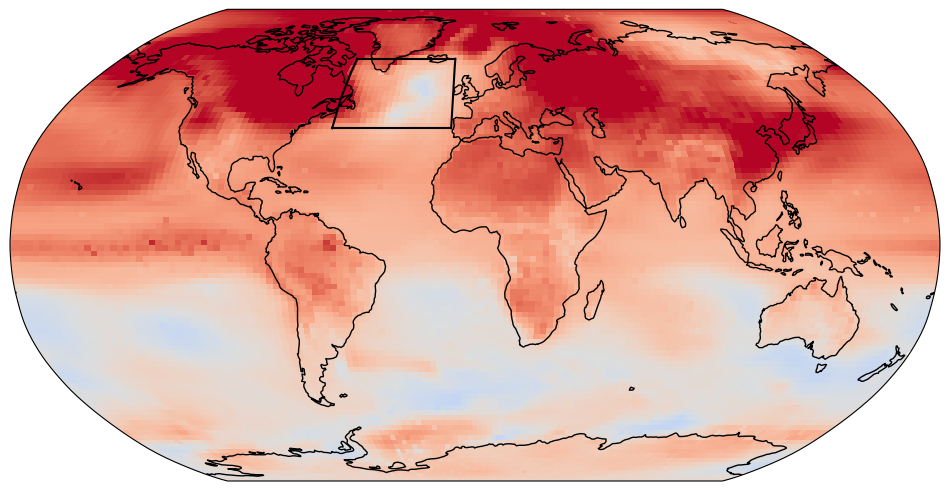

In [15]:
#plot box on map to show north atlantic:

fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection=proj)
ax.coastlines()

#plot global mean tas:
ramip_AeroGP_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm1, add_colorbar=False)

#plot box:
ax.plot([300,300],[40,65],transform=ccrs.PlateCarree(),color='black')
ax.plot([350,350],[40,65],transform=ccrs.PlateCarree(),color='black')
ax.plot([300,350],[40,40],transform=ccrs.PlateCarree(),color='black')
ax.plot([300,350],[65,65],transform=ccrs.PlateCarree(),color='black')

# Figure 4: Global mean tas change for training data and RAMIP T1 and hist-aer AeroGP

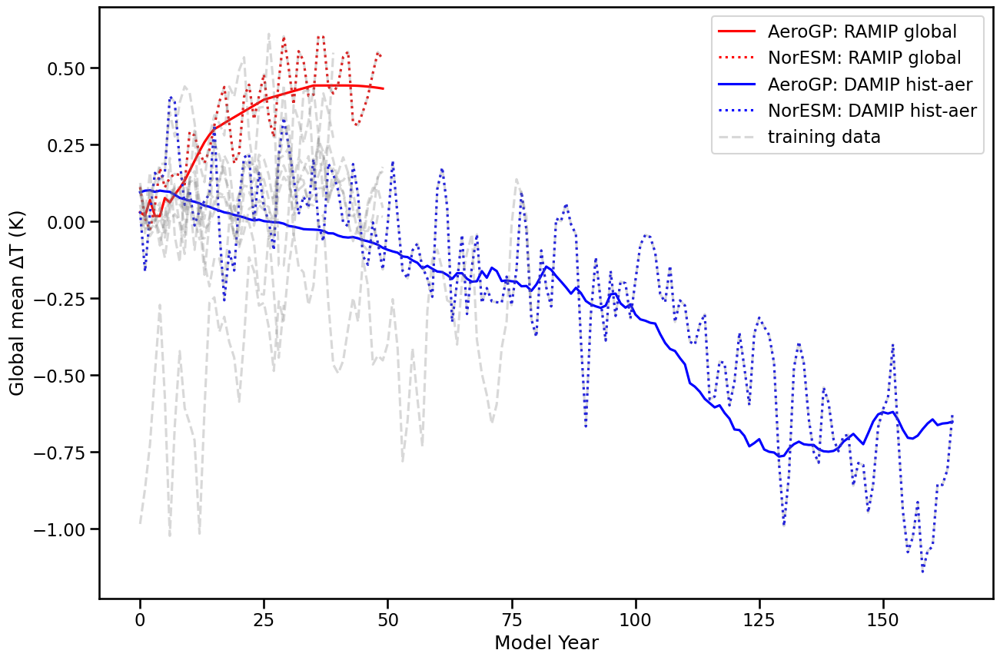

In [134]:
#plot global mean tas comparison:
with sns.plotting_context("talk"):
    plt.figure(figsize=(15,10))
    plt.plot(lat_weighted_mean(ramip_AeroGP['posterior']),color='r')
    plt.plot(lat_weighted_mean(ramip_NorESM['tas_diff']), linestyle=':',color='r')
    plt.plot(lat_weighted_mean(histaer_AeroGP['posterior']),color='b')
    plt.plot(lat_weighted_mean(histaer_NorESM['tas_diff']),color='b',linestyle=':')
    for ii in exps:
        if ii == 'RAMIP T1':
            continue
        if ii == 'hist-aer':
            continue
        plt.plot(lat_weighted_mean(outputs_ALL.where(outputs_ALL.experiment==ii, drop=True)['tas_diff']),alpha=0.3, linestyle='--',color='grey')
    plt.xlabel('Model Year')
    plt.ylabel("Global mean $\Delta$T (K)")
    plt.legend(['AeroGP: RAMIP global', 'NorESM: RAMIP global', 'AeroGP: DAMIP hist-aer', 'NorESM: DAMIP hist-aer', 'training data'])

# Figure 5: Zonal mean temperate prediction for RAMIP T1 and DAMIP hist-aer for 4 zonal bands: southern hemisphere, tropics, northern midlatitudes and arctic

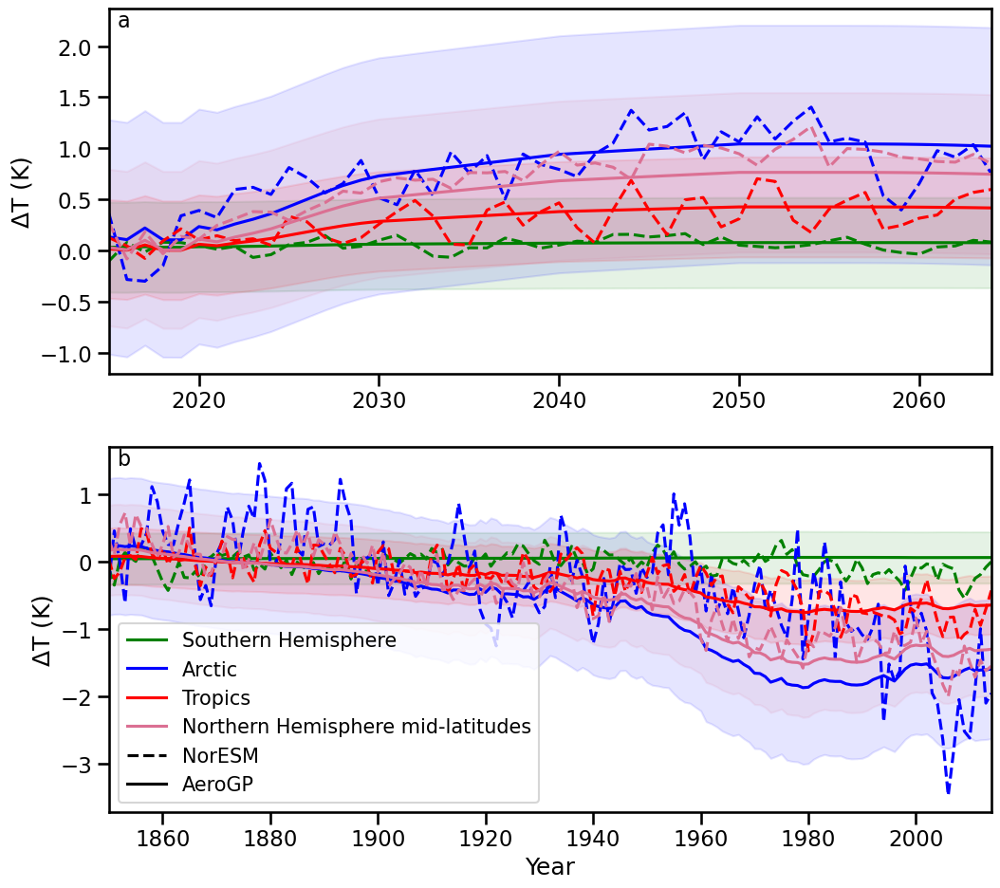

In [135]:
#plot posterior mean (would be nice to plot samples of the latent function!)

def SH_data(data):
    return lat_weighted_mean(data.sel(lat=slice(-90,-30)))
def tropics_data(data):
    return lat_weighted_mean(data.sel(lat=slice(-30,30)))
def NHml_data(data):
    return lat_weighted_mean(data.sel(lat=slice(30,60)))
def Arctic_data(data):
    return lat_weighted_mean(data.sel(lat=slice(60,90)))



with sns.plotting_context('talk'):
    fig = plt.figure(figsize=(12, 11))

    ax1 = plt.subplot(211)
    
    SH_data(ramip_AeroGP['posterior']).plot(label='Southern Hemisphere',color='g')
    plt.fill_between(ramip_AeroGP['posterior std'].year, 
                     SH_data(ramip_AeroGP['posterior']) - np.sqrt(SH_data(np.power(ramip_AeroGP['posterior std'],2))),
                        SH_data(ramip_AeroGP['posterior']) + np.sqrt(SH_data(np.power(ramip_AeroGP['posterior std'],2))), 
                        color='g', alpha=0.1)
    SH_data(ramip_NorESM['tas_diff']).plot(color='g',linestyle='--')

    Arctic_data(ramip_AeroGP['posterior']).plot(label='Arctic',color='b')
    plt.fill_between(ramip_AeroGP['posterior std'].year,
                        Arctic_data(ramip_AeroGP['posterior']) - np.sqrt(Arctic_data(np.power(ramip_AeroGP['posterior std'],2))),
                        Arctic_data(ramip_AeroGP['posterior']) + np.sqrt(Arctic_data(np.power(ramip_AeroGP['posterior std'],2))),
                        color='b', alpha=0.1)
    Arctic_data(ramip_NorESM['tas_diff']).plot(color='b',linestyle='--')

    tropics_data(ramip_AeroGP['posterior']).plot(label='Tropics',color='r')
    plt.fill_between(ramip_AeroGP['posterior std'].year,
                        tropics_data(ramip_AeroGP['posterior']) - np.sqrt(tropics_data(np.power(ramip_AeroGP['posterior std'],2))),
                        tropics_data(ramip_AeroGP['posterior']) + np.sqrt(tropics_data(np.power(ramip_AeroGP['posterior std'],2))),
                        color='r', alpha=0.1)
    tropics_data(ramip_NorESM['tas_diff']).plot(color='r',linestyle='--')

    NHml_data(ramip_AeroGP['posterior']).plot(label='Northern Hemisphere mid-latitudes',color='palevioletred')
    plt.fill_between(ramip_AeroGP['posterior std'].year,
                        NHml_data(ramip_AeroGP['posterior']) - np.sqrt(NHml_data(np.power(ramip_AeroGP['posterior std'],2))),
                        NHml_data(ramip_AeroGP['posterior']) + np.sqrt(NHml_data(np.power(ramip_AeroGP['posterior std'],2))),
                        color='palevioletred', alpha=0.1)
    NHml_data(ramip_NorESM['tas_diff']).plot(color='palevioletred',linestyle='--')

    plt.gca().set_xlabel('')
    plt.gca().set_ylabel("$\Delta$T (K)")
    plt.gca().autoscale(enable=True, axis='x', tight=True)
    plt.gca().annotate('a', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    # create manual symbols for legend
    handles, labels = plt.gca().get_legend_handles_labels()
    from matplotlib.lines import Line2D
    line1 = Line2D([0], [0], label='NorESM', color='k', linestyle='--')
    line2 = Line2D([0], [0], label='AeroGP', color='k', linestyle='-')
    handles.extend([line1,line2])

    ax2 = plt.subplot(212)

    SH_data(histaer_AeroGP['posterior']).plot(label='Southern Hemisphere',color='g')
    plt.fill_between(histaer_AeroGP['posterior std'].year,
                        SH_data(histaer_AeroGP['posterior']) - np.sqrt(SH_data(np.power(histaer_AeroGP['posterior std'],2))),
                        SH_data(histaer_AeroGP['posterior']) + np.sqrt(SH_data(np.power(histaer_AeroGP['posterior std'],2))),
                        color='g', alpha=0.1)
    SH_data(histaer_NorESM['tas_diff']).plot(color='g',linestyle='--')

    Arctic_data(histaer_AeroGP['posterior']).plot(label='Arctic',color='b')
    plt.fill_between(histaer_AeroGP['posterior std'].year,
                        Arctic_data(histaer_AeroGP['posterior']) - np.sqrt(Arctic_data(np.power(histaer_AeroGP['posterior std'],2))),
                        Arctic_data(histaer_AeroGP['posterior']) + np.sqrt(Arctic_data(np.power(histaer_AeroGP['posterior std'],2))),
                        color='b', alpha=0.1)
    Arctic_data(histaer_NorESM['tas_diff']).plot(color='b',linestyle='--')

    tropics_data(histaer_AeroGP['posterior']).plot(label='Tropics',color='r')
    plt.fill_between(histaer_AeroGP['posterior std'].year,
                        tropics_data(histaer_AeroGP['posterior']) - np.sqrt(tropics_data(np.power(histaer_AeroGP['posterior std'],2))),
                        tropics_data(histaer_AeroGP['posterior']) + np.sqrt(tropics_data(np.power(histaer_AeroGP['posterior std'],2))),
                        color='r', alpha=0.1)
    tropics_data(histaer_NorESM['tas_diff']).plot(color='r',linestyle='--')

    NHml_data(histaer_AeroGP['posterior']).plot(label='Northern Hemisphere mid-latitudes',color='palevioletred')
    plt.fill_between(histaer_AeroGP['posterior std'].year,
                        NHml_data(histaer_AeroGP['posterior']) - np.sqrt(NHml_data(np.power(histaer_AeroGP['posterior std'],2))),
                        NHml_data(histaer_AeroGP['posterior']) + np.sqrt(NHml_data(np.power(histaer_AeroGP['posterior std'],2))),
                        color='palevioletred', alpha=0.1)
    NHml_data(histaer_NorESM['tas_diff']).plot(color='palevioletred',linestyle='--')

    plt.gca().set_xlabel('Year')
    plt.gca().set_ylabel("$\Delta$T (K)")
    plt.gca().annotate('b', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)
    plt.legend(loc='lower left',handles=handles,fontsize='small')
    plt.autoscale(enable=True, axis='x', tight=True)


# Figure 6:  comparison maps for three sensitivity experiments 


In [163]:
# load data:
sens_dir = '../logs/sensitivity_tests/'

histaer_AeroGP_1 = xr.open_dataset(sens_dir + 'posterior_predictY_hist-aer_20250820-210013.nc')
histaer01_AeroGP = xr.open_dataset(sens_dir + 'posterior_predictY_histaer01_20250820-201705.nc')
histaer05_AeroGP = xr.open_dataset(sens_dir + 'posterior_predictY_histaer05_20250820-204441.nc')
histaer2_AeroGP = xr.open_dataset(sens_dir + 'posterior_predictY_histaer2_20250820-195629.nc')

ramipea_AeroGP = xr.open_dataset(sens_dir + 'posterior_predictY_ramip_ea_20250820-205822.nc')
ramipea01_AeroGP = xr.open_dataset(sens_dir + 'posterior_predictY_ramipEA01_20250820-204654.nc')
ramipea05_AeroGP = xr.open_dataset(sens_dir + 'posterior_predictY_ramipEA05_20250820-204907.nc')
ramipea2_AeroGP = xr.open_dataset(sens_dir + 'posterior_predictY_ramipEA2_20250820-204743.nc')

ea5_so2 = xr.open_dataset(sens_dir + 'posterior_predictY_5xEA_SO2_20250820-205700.nc')
ea5_so2_01 = xr.open_dataset(sens_dir + 'posterior_predictY_5xEA_SO2_01_20250820-205204.nc')
ea5_so2_05 = xr.open_dataset(sens_dir + 'posterior_predictY_5xEA_SO2_05_20250820-205140.nc')
ea5_so2_2 = xr.open_dataset(sens_dir + 'posterior_predictY_5xEA_SO2_2_20250820-205056.nc')



In [166]:
#take mean of select years for transient cases:
histaer_yrs = slice(1995,2014)
ramip_yrs = slice(2045,2064)

#column 1 means:
col1_means = [histaer01_AeroGP['posterior'].sel(year=histaer_yrs).mean('year'),
 histaer05_AeroGP['posterior'].sel(year=histaer_yrs).mean('year'),
 histaer_AeroGP['posterior'].sel(year=histaer_yrs).mean('year'),
 histaer2_AeroGP['posterior'].sel(year=histaer_yrs).mean('year')]

AeroGP_mean = histaer01_AeroGP['posterior'].sel(year=histaer_yrs).mean('year')

#column 1 robust areas:
col1_robust = [AeroGP_mean.where(significant_CI(histaer01_AeroGP['posterior'].sel(year=histaer_yrs), histaer01_AeroGP['posterior std'].sel(year=histaer_yrs), ci=0.68).any(axis=0)),
               AeroGP_mean.where(significant_CI(histaer05_AeroGP['posterior'].sel(year=histaer_yrs), histaer05_AeroGP['posterior std'].sel(year=histaer_yrs), ci=0.68).any(axis=0)),
               AeroGP_mean.where(significant_CI(histaer_AeroGP['posterior'].sel(year=histaer_yrs), histaer_AeroGP['posterior std'].sel(year=histaer_yrs), ci=0.68).any(axis=0)),
               AeroGP_mean.where(significant_CI(histaer2_AeroGP['posterior'].sel(year=histaer_yrs), histaer2_AeroGP['posterior std'].sel(year=histaer_yrs), ci=0.68).any(axis=0))]

#column 2 means:
col2_means = [ramipea01_AeroGP['posterior'].sel(year=ramip_yrs).mean('year'),
    ramipea05_AeroGP['posterior'].sel(year=ramip_yrs).mean('year'),
    ramipea_AeroGP['posterior'].sel(year=ramip_yrs).mean('year'),
    ramipea2_AeroGP['posterior'].sel(year=ramip_yrs).mean('year')]

#column 2 robust areas:
col2_robust = [AeroGP_mean.where(significant_CI(ramipea01_AeroGP['posterior'].sel(year=ramip_yrs), ramipea01_AeroGP['posterior std'].sel(year=ramip_yrs), ci=0.38).any(axis=0)),
    AeroGP_mean.where(significant_CI(ramipea05_AeroGP['posterior'].sel(year=ramip_yrs), ramipea05_AeroGP['posterior std'].sel(year=ramip_yrs), ci=0.38).any(axis=0)),
    AeroGP_mean.where(significant_CI(ramipea_AeroGP['posterior'].sel(year=ramip_yrs), ramipea_AeroGP['posterior std'].sel(year=ramip_yrs), ci=0.38).any(axis=0)),
    AeroGP_mean.where(significant_CI(ramipea2_AeroGP['posterior'].sel(year=ramip_yrs), ramipea2_AeroGP['posterior std'].sel(year=ramip_yrs), ci=0.38).any(axis=0))]

#column 3 means:
col3_means = [ea5_so2_01['posterior'],
    ea5_so2_05['posterior'],
    ea5_so2['posterior'],
    ea5_so2_2['posterior']]

#column 3 robust areas:
col3_robust = [AeroGP_mean.where(significant_CI(ea5_so2_01['posterior'], ea5_so2_01['posterior std'], ci=0.38)),
    AeroGP_mean.where(significant_CI(ea5_so2_05['posterior'], ea5_so2_05['posterior std'], ci=0.38)),
    AeroGP_mean.where(significant_CI(ea5_so2['posterior'], ea5_so2['posterior std'], ci=0.38)),
    AeroGP_mean.where(significant_CI(ea5_so2_2['posterior'], ea5_so2_2['posterior std'], ci=0.38))]

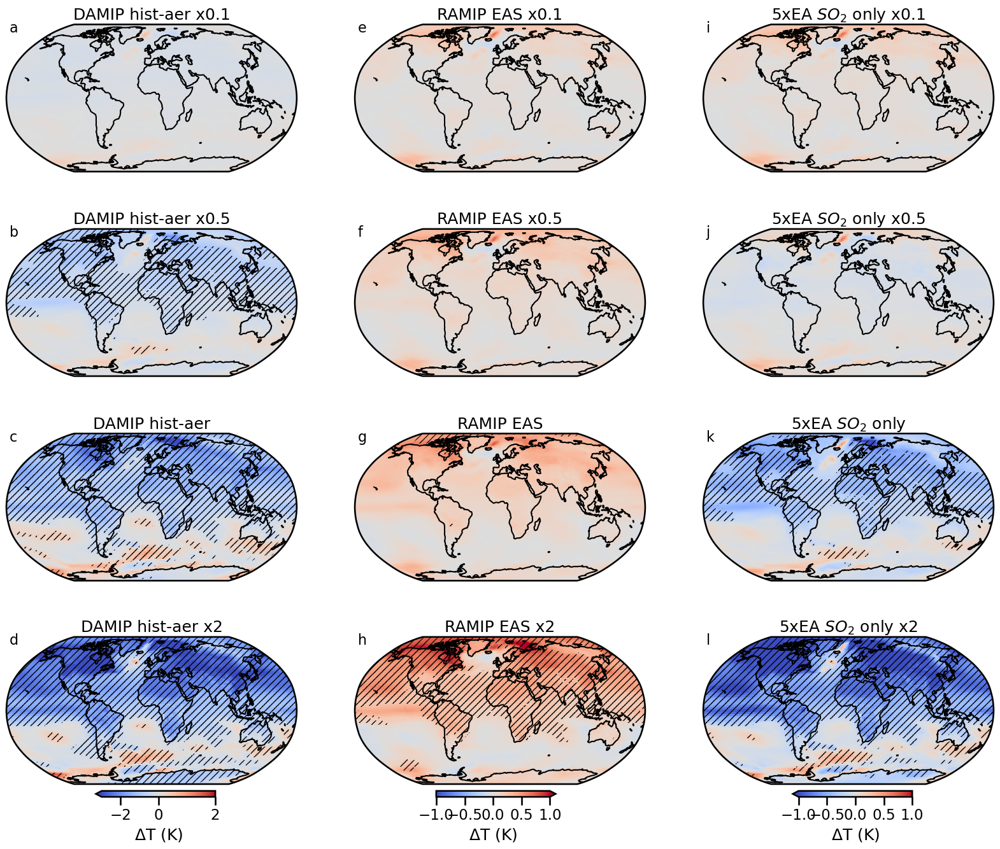

In [167]:
col1_title = 'DAMIP hist-aer'
col2_title = 'RAMIP EAS'
col3_title = '5xEA $SO_2$ only'

divnorm_col1 = colors.TwoSlopeNorm(vmin=-3., vcenter=0., vmax=2.)
divnorm_col2 = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)
divnorm_col3 = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)

proj = ccrs.Robinson()

with sns.plotting_context("talk"):
    fig = plt.figure(figsize=(20, 16))

    plt.subplot(431, projection=proj)
    col1_means[0].plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm_col1, add_colorbar=False)
    plt.pcolor(col1_means[0].lon, col1_means[0].lat, col1_robust[0], hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title=col1_title + ' x0.1')
    plt.gca().annotate('a', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(434, projection=proj)
    col1_means[1].plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm_col1, add_colorbar=False)
    plt.pcolor(col1_means[1].lon, col1_means[1].lat, col1_robust[1], hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title=col1_title + ' x0.5')
    plt.gca().annotate('b', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(437, projection=proj)
    col1_means[2].plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm_col1, add_colorbar=False)
    plt.pcolor(col1_means[2].lon, col1_means[2].lat, col1_robust[2], hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title=col1_title)
    plt.gca().annotate('c', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(4,3,10, projection=proj)
    col1_means[3].plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm_col1, cbar_kwargs={"label":"$\Delta$T (K)",'pad':0.04,'fraction':0.035, 'orientation':'horizontal'})
    plt.pcolor(col1_means[3].lon, col1_means[3].lat, col1_robust[3], hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title=col1_title + ' x2')
    plt.gca().annotate('d', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(432, projection=proj)
    col2_means[0].plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm_col2, add_colorbar=False)
    plt.pcolor(col2_means[0].lon, col2_means[0].lat, col2_robust[0], hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title=col2_title + ' x0.1')
    plt.gca().annotate('e', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(435, projection=proj)
    col2_means[1].plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm_col2, add_colorbar=False)
    plt.pcolor(col2_means[1].lon, col2_means[1].lat, col2_robust[1], hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title=col2_title + ' x0.5')
    plt.gca().annotate('f', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(438, projection=proj)
    col2_means[2].plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm_col2, add_colorbar=False)
    plt.pcolor(col2_means[2].lon, col2_means[2].lat, col2_robust[2], hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title=col2_title)
    plt.gca().annotate('g', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(4,3,11, projection=proj)
    col2_means[3].plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm_col2, cbar_kwargs={"label":"$\Delta$T (K)",'pad':0.04,'fraction':0.035, 'orientation':'horizontal'})
    plt.pcolor(col2_means[3].lon, col2_means[3].lat, col2_robust[3], hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title=col2_title + ' x2')
    plt.gca().annotate('h', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(433, projection=proj)
    col3_means[0].plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm_col3, add_colorbar=False)
    plt.pcolor(col3_means[0].lon, col3_means[0].lat, col3_robust[0], hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title=col3_title + ' x0.1')
    plt.gca().annotate('i', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(436, projection=proj)
    col3_means[1].plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm_col3, add_colorbar=False)
    plt.pcolor(col3_means[1].lon, col3_means[1].lat, col3_robust[1], hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title=col3_title + ' x0.5')
    plt.gca().annotate('j', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(439, projection=proj)
    col3_means[2].plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm_col3, add_colorbar=False)
    plt.pcolor(col3_means[2].lon, col3_means[2].lat, col3_robust[2], hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title=col3_title)
    plt.gca().annotate('k', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(4,3,12, projection=proj)
    col3_means[3].plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm_col3, cbar_kwargs={"label":"$\Delta$T (K)",'pad':0.04,'fraction':0.035, 'orientation':'horizontal'})
    plt.pcolor(col3_means[3].lon, col3_means[3].lat, col3_robust[3], hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title=col3_title + ' x2')
    plt.gca().annotate('l', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

In [10]:
print('hist-aer mean:',lat_weighted_mean(histaer_AeroGP['posterior'].sel(year=histaer_yrs).mean('year')))
print('5xEA so2 mena: ', lat_weighted_mean(ea5_so2['posterior']))

hist-aer mean: <xarray.DataArray 'posterior' ()> Size: 8B
array(-0.65739101)
5xEA so2 mena:  <xarray.DataArray 'posterior' ()> Size: 8B
array(-0.14908221)


# Heatmaps of Arctic temperature change to regional perturbations

In [114]:
#get data into data frame
import re

def extract_arctic_mean(file, lat_min=60):
    """Load file and compute Arctic mean temperature response."""
    ds = xr.open_dataset(file)

    # assume variable is named 'temp' (adjust if different)
    da = ds['posterior']

    # Select Arctic region (lat >= 60)
    da_arctic = da.sel(lat=slice(lat_min, 90))

    # Weighted mean by cosine(lat) for area weighting
    arctic_mean = lat_weighted_mean(da_arctic)

    return float(arctic_mean.values)

def parse_metadata(filename):
    m = re.search(r"posterior_predictY_(\w+)_([A-Za-z]+)", filename)
    if m:
        region, species_raw = m.groups()
        # Strip trailing 'remov' if present
        species = re.sub(r'(remov|x)$', '', species_raw)
    else:
        region, species = "unknown", "unknown"

    return region, species

def extract_emissions(region, species, scale):
    if species == 'SO':
        species = 'SO2'
    ds = xr.open_dataset('../testing_data/inputs_'+region+'_'+species+scale+'.nc')
    return '('+str(np.round(ds[species].sum().values,1))+')'

def build_dataframe(data_dir, scale):
    records = []
    for f in glob.glob(f"{data_dir}/posterior_predictY_*"+scale+"*202509*.nc"):
        arctic_temp = extract_arctic_mean(f, lat_min=60)
        region, species = parse_metadata(f)
        emissions = extract_emissions(region, species, scale)
        records.append(dict(arctic_temp=arctic_temp,
                            species=species,
                            region=region,
                            emissions=emissions))
                            #scaled=arctic_temp/emissions if emissions != 0 else None))
    return pd.DataFrame(records)


df = build_dataframe("../logs/zeroZinit_test/", "x2")
df['region'] = df['region'].replace({'wa': 'sa'}) #rename western Asia to south Asia
print(df)



    arctic_temp species region emissions
0      0.278894      BC     af     (3.4)
1     -0.052836      OC     af     (9.7)
2     -0.314491      SO     af    (30.2)
3      0.320675      BC     ea     (4.9)
4     -0.091976      OC     ea    (11.4)
5     -0.421388      SO     ea    (39.3)
6      0.216435      BC     eu     (0.3)
7      0.131790      OC     eu     (0.9)
8      0.066937      SO     eu     (6.8)
9      0.217974      BC     na     (0.6)
10     0.117717      OC     na     (1.6)
11    -0.036692      SO     na    (12.2)
12     0.229022      BC     ru     (0.3)
13     0.125410      OC     ru     (0.6)
14    -0.093436      SO     ru     (9.2)
15     0.272408      BC     sa     (2.9)
16    -0.024106      OC     sa     (8.8)
17    -0.466912      SO     sa    (42.0)


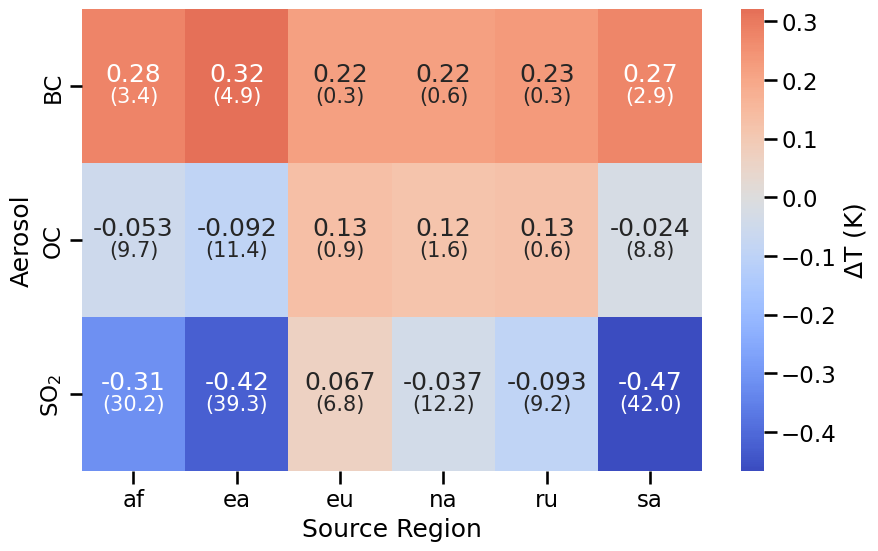

In [120]:
# Heatmap 
with sns.plotting_context("talk"):
    plt.figure(figsize=(10, 6))
    pivot = df.pivot(index="species", columns="region", values="arctic_temp")
    emiss_labels = df.pivot(index="species", columns="region", values="emissions")
    
    ax=sns.heatmap(pivot, annot=True, annot_kws={'va':'bottom'}, cmap="coolwarm", center=0, cbar_kws={"label": "$\Delta$T (K)"})
    #sns.heatmap(pivot, annot=emiss_labels, annot_kws={'va':'top','fontsize':'small', 'color':'xkcd:dark grey'}, fmt="", cbar=False)
    temp_texts = ax.texts  # one text object per cell

    # Add emission labels using the same color as the temp labels
    for k, text in enumerate(temp_texts):
        x, y = text.get_position()
        emiss = emiss_labels.to_numpy().flatten()[k]
        ax.text(
            x, y, f"{emiss}",
            ha='center', va='top',
            fontsize='small',
            color=text.get_color()  # reuse seaborn's chosen color
        )

    plt.xlabel("Source Region")
    plt.ylabel("Aerosol")
    plt.gca().set_yticklabels(['BC','OC','SO$_2$'])



In [79]:
def single_Arctic_map(file):

    with sns.plotting_context("talk"):
        fig, axes = plt.subplots(1,1, figsize=(14, 8), subplot_kw={'projection': None})

        ds = xr.open_dataset(file)

        # Prepare lon/lat grid
        data_cyclic, lons_cyclic = addcyclic(ds['posterior'].values, ds['lon'].values)
        lon2d, lat2d = np.meshgrid(lons_cyclic, ds['lat'].values)

        hatch_cyclic, lons_cyclic = addcyclic(ds['posterior'].where(significant_CI(ds['posterior'], ds['posterior std'], ci=0.38)), ds['lon'].values)

        # Basemap tied to subplot
        m = Basemap(
            resolution='c',
            projection='ortho',
            lat_0=90., lon_0=340.,
            ax=axes
        )

        x, y = m(lon2d, lat2d)

        vmin, vmax = -0.6, 0.6
        norm = colors.Normalize(vmin=vmin, vmax=vmax)
        levels = np.linspace(vmin, vmax, 13)

        # Plot filled contours
        im = m.contourf(x, y, data_cyclic, levels=levels, cmap="coolwarm", norm=norm, extend="both")
        #m.contourf(x, y, hatch_cyclic, colors='none', hatches=['///'], alpha=0.0)

        # Coastlines and grid
        m.drawcoastlines()
        parallels = np.arange(-80., 90, 20.)
        meridians = np.arange(0., 360., 20.)
        m.drawparallels(parallels)
        m.drawmeridians(meridians)

        # Highlight 65N
        m.drawparallels([60.], linewidth=2, color="black", latmax=60)

        #fig.colorbar(im, cax=axes, norm=norm, cmap='coolwarm', extend="both")

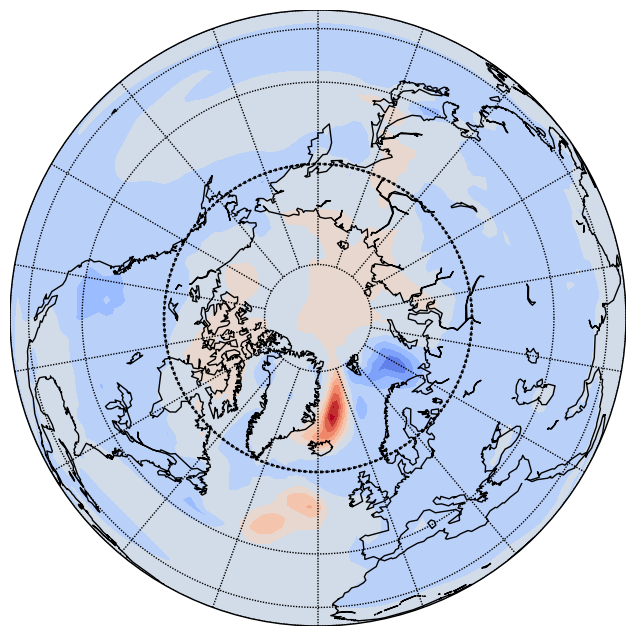

In [116]:
single_Arctic_map('../logs/zeroZinit_test/posterior_predictY_af_OCx2_20250904-140521.nc')

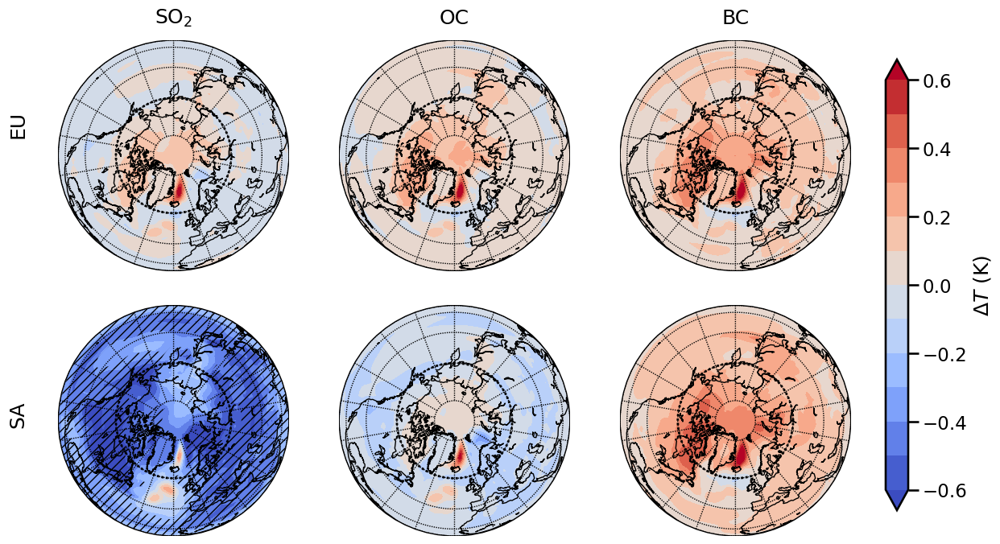

In [ ]:


datasets = [
    '../logs/zeroZinit_test/posterior_predictY_eu_SO2x2_20250904-140927.nc',
    "../logs/zeroZinit_test/posterior_predictY_eu_OCx2_20250904-140854.nc",
    "../logs/zeroZinit_test/posterior_predictY_eu_BCx2_20250904-140819.nc",
    "../logs/zeroZinit_test/posterior_predictY_wa_SO2x2_20250904-141442.nc",
    "../logs/zeroZinit_test/posterior_predictY_wa_OCx2_20250904-141408.nc",
    "../logs/zeroZinit_test/posterior_predictY_wa_BCx2_20250904-141336.nc",
]


with sns.plotting_context("talk"):
    fig, axes = plt.subplots(2, 3, figsize=(14, 8), subplot_kw={'projection': None})
    axes = axes.flatten()

    for ax, f in zip(axes, datasets):
        ds = xr.open_dataset(f)

        # Prepare lon/lat grid
        data_cyclic, lons_cyclic = addcyclic(ds['posterior'].drop_vars('year').values, ds['lon'].values)
        lon2d, lat2d = np.meshgrid(lons_cyclic, ds['lat'].values)

        hatch_cyclic, lons_cyclic = addcyclic(ds['posterior'].where(significant_CI(ds['posterior'], ds['posterior std'], ci=0.38)), ds['lon'].values)

        # Basemap tied to subplot
        m = Basemap(
            resolution='c',
            projection='ortho',
            lat_0=90., lon_0=340.,
            ax=ax
        )

        x, y = m(lon2d, lat2d)

        vmin, vmax = -0.6, 0.6
        norm = colors.Normalize(vmin=vmin, vmax=vmax)
        levels = np.linspace(vmin, vmax, 13)

        # Plot filled contours
        im = m.contourf(x, y, data_cyclic, levels=levels, cmap="coolwarm", norm=norm, extend="both")
        m.contourf(x, y, hatch_cyclic, colors='none', hatches=['///'], alpha=0.0)

        # Coastlines and grid
        m.drawcoastlines()
        parallels = np.arange(-80., 90, 20.)
        meridians = np.arange(0., 360., 20.)
        m.drawparallels(parallels)
        m.drawmeridians(meridians)

        # Highlight 65N
        m.drawparallels([60.], linewidth=2, color="black", latmax=60)

        #region = f.split("_")[3]+" "+f.split("_")[4]
        #ax.set_title(region)


    fig.subplots_adjust(right=0.85, hspace=0.15, wspace=0.1)

    # One shared colorbar
    cbar_ax = fig.add_axes([0.87, 0.15, 0.02, 0.7])
    cbar = fig.colorbar(im, cax=cbar_ax, norm=norm, cmap='coolwarm', extend="both")
    cbar.ax.tick_params(direction="out")
    cbar.set_label(r"$\Delta T$ (K)")

    # Column titles (species)
    col_titles = ["SO$_2$", "OC", "BC"]
    for i, title in enumerate(col_titles):
        axes[i].set_title(title, pad=15)

    # Row titles (regions)
    row_titles = ["EU", "SA"]
    for i, title in enumerate(row_titles):
        fig.text(0.1, 0.75 - i*0.45, title, va="center", ha="center", rotation=90)



In [ ]:
# supplemenary plot looking at regional temperature response to removal of emissions:

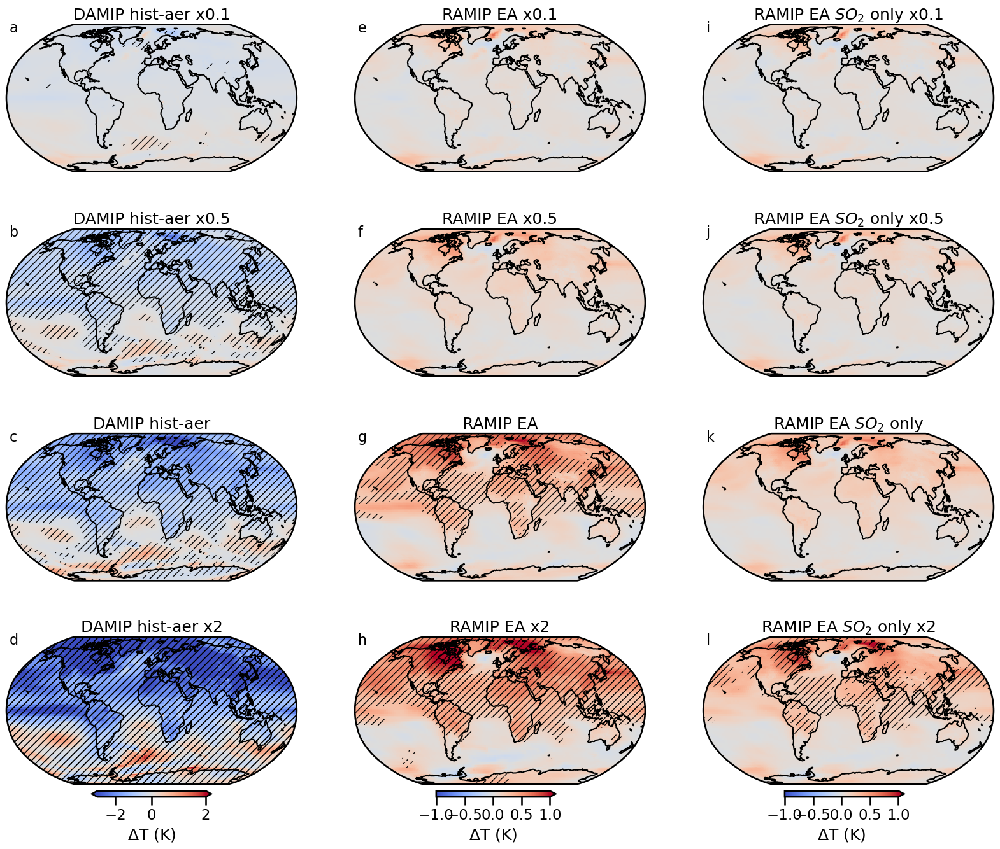

: 

In [ ]:
#take mean of select years for transient cases:
histaer_yrs = slice(1995,2014)
ramipea_yrs = slice(2045,2065)

histaer01_mean = histaer01_AeroGP['posterior'].sel(year=histaer_yrs).mean('year')
histaer05_mean = histaer05_AeroGP['posterior'].sel(year=histaer_yrs).mean('year')
histaer2_mean = histaer2_AeroGP['posterior'].sel(year=histaer_yrs).mean('year')

ramipea_mean = ramipea_AeroGP['posterior'].sel(year=ramipea_yrs).mean('year')
ramipea01_mean = ramipea01_AeroGP['posterior'].sel(year=ramipea_yrs).mean('year')
ramipea05_mean = ramipea05_AeroGP['posterior'].sel(year=ramipea_yrs).mean('year')
ramipea2_mean = ramipea2_AeroGP['posterior'].sel(year=ramipea_yrs).mean('year')

ramipea_so2only_01_mean = ramipea_so2only_01['posterior'].sel(year=ramipea_yrs).mean('year')
ramipea_so2only_05_mean = ramipea_so2only_05['posterior'].sel(year=ramipea_yrs).mean('year')
ramipea_so2only_mean = ramipea_so2only['posterior'].sel(year=ramipea_yrs).mean('year')
ramipea_so2only_2_mean = ramipea_so2only_2['posterior'].sel(year=ramipea_yrs).mean('year')


#where signal is robust:
histaer01_robust = find_robust_AeroGP(histaer01_AeroGP, histaer_yrs)
histaer05_robust = find_robust_AeroGP(histaer05_AeroGP, histaer_yrs)
histaer2_robust = find_robust_AeroGP(histaer2_AeroGP, histaer_yrs)

ramipea_robust = find_robust_AeroGP(ramipea_AeroGP, ramipea_yrs)
ramipea01_robust = find_robust_AeroGP(ramipea01_AeroGP, ramipea_yrs)
ramipea05_robust = find_robust_AeroGP(ramipea05_AeroGP, ramipea_yrs)
ramipea2_robust = find_robust_AeroGP(ramipea2_AeroGP, ramipea_yrs)

ramipea_so2only_01_robust = find_robust_AeroGP(ramipea_so2only_01, ramipea_yrs)
ramipea_so2only_05_robust = find_robust_AeroGP(ramipea_so2only_05, ramipea_yrs)
ramipea_so2only_robust = find_robust_AeroGP(ramipea_so2only, ramipea_yrs)
ramipea_so2only_2_robust = find_robust_AeroGP(ramipea_so2only_2, ramipea_yrs)

divnorm3 = colors.TwoSlopeNorm(vmin=-3., vcenter=0., vmax=2.)


with sns.plotting_context("talk"):
    fig = plt.figure(figsize=(20, 16))

    plt.subplot(431, projection=proj)
    histaer01_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm3, add_colorbar=False)
    plt.pcolor(histaer01_robust.lon, histaer01_robust.lat, histaer01_robust, hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='DAMIP hist-aer x0.1')
    plt.gca().annotate('a', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(434, projection=proj)
    histaer05_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm3, add_colorbar=False)
    plt.pcolor(histaer05_robust.lon, histaer05_robust.lat, histaer05_robust, hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='DAMIP hist-aer x0.5')
    plt.gca().annotate('b', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(437, projection=proj)
    histaer_AeroGP_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm3, add_colorbar=False)
    plt.pcolor(histaer_AeroGP_mean.lon, histaer_AeroGP_mean.lat, histaer_AeroGP_mean.where(np.abs(histaer_AeroGP_mean)>hist_gp_std*0.5), hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='DAMIP hist-aer')
    plt.gca().annotate('c', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(4,3,10, projection=proj)
    histaer2_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm3, cbar_kwargs={"label":"$\Delta$T (K)",'pad':0.04,'fraction':0.035, 'orientation':'horizontal'})
    plt.pcolor(histaer2_robust.lon, histaer2_robust.lat, histaer2_robust, hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='DAMIP hist-aer x2')
    plt.gca().annotate('d', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(432, projection=proj)
    ramipea01_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm1, add_colorbar=False)
    plt.pcolor(ramipea01_robust.lon, ramipea01_robust.lat, ramipea01_robust, hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='RAMIP EA x0.1')
    plt.gca().annotate('e', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(435, projection=proj)
    ramipea05_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm1, add_colorbar=False)
    plt.pcolor(ramipea05_robust.lon, ramipea05_robust.lat, ramipea05_robust, hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='RAMIP EA x0.5')
    plt.gca().annotate('f', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(438, projection=proj)
    ramipea_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm1, add_colorbar=False)
    plt.pcolor(ramipea_robust.lon, ramipea_robust.lat, ramipea_robust, hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='RAMIP EA')
    plt.gca().annotate('g', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(4,3,11, projection=proj)
    ramipea2_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm1, cbar_kwargs={"label":"$\Delta$T (K)",'pad':0.04,'fraction':0.035,'orientation':'horizontal'})
    plt.pcolor(ramipea2_robust.lon, ramipea2_robust.lat, ramipea2_robust, hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='RAMIP EA x2')
    plt.gca().annotate('h', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(433, projection=proj)
    ramipea_so2only_01_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm1, add_colorbar=False)
    plt.pcolor(ramipea_so2only_01_robust.lon, ramipea_so2only_01_robust.lat, ramipea_so2only_01_robust, hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='RAMIP EA $SO_2$ only x0.1')
    plt.gca().annotate('i', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(436, projection=proj)
    ramipea_so2only_05_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm1, add_colorbar=False)
    plt.pcolor(ramipea_so2only_05_robust.lon, ramipea_so2only_05_robust.lat, ramipea_so2only_05_robust, hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='RAMIP EA $SO_2$ only x0.5')
    plt.gca().annotate('j', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(439, projection=proj)
    ramipea_so2only_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm1, add_colorbar=False)
    plt.pcolor(ramipea_so2only_robust.lon, ramipea_so2only_robust.lat, ramipea_so2only_robust, hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='RAMIP EA $SO_2$ only')
    plt.gca().annotate('k', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(4,3,12, projection=proj)
    ramipea_so2only_2_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm1, cbar_kwargs={"label":"$\Delta$T (K)",'pad':0.04,'fraction':0.035,'orientation':'horizontal'})
    plt.pcolor(ramipea_so2only_2_robust.lon, ramipea_so2only_2_robust.lat, ramipea_so2only_2_robust, hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='RAMIP EA $SO_2$ only x2')
    plt.gca().annotate('l', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

# Comparison of training RAMIP T1 with only NorESM2 experiments vs all training data

In [ ]:
#ramip_AeroGP_noresm2 = xr.open_dataset('../logs/logs_RAMIP T1/sensitivity_test/posterior_predictY_ramip_t1_NorESM2only.nc')
ramip_AeroGP_noresm2 = xr.open_dataset('../logs/lr_1lin/RAMIP T1_noresm2/posterior_predictY_ramip_t1_20250325-064851.nc')

ramip_AeroGP_noresm2_mean = ramip_AeroGP_noresm2['posterior'].sel(year=slice(2045,2065)).mean('year')

ramip2_diff = ramip_AeroGP_noresm2_mean - ramip_NorESM_mean

ramip2_std = np.sqrt(np.power(ramip_AeroGP_noresm2['posterior std'].sel(year=slice(2045,2065)),2).mean('year'))

z_em2,p_ramipdiff2 = ttest(ramip_NorESM_mean, ramip_nor_std, 20, ramip_AeroGP_noresm2_mean, ramip2_std, 20, equal_var=False, alternative='two-sided')

: 

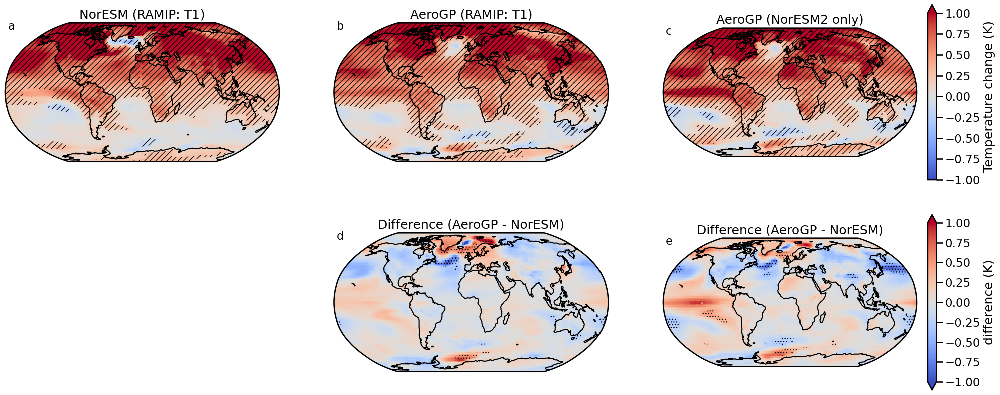

In [18]:
divnorm1 = colors.TwoSlopeNorm(vmin=-1., vcenter=0., vmax=1.)

proj = ccrs.Robinson()

with sns.plotting_context("talk"):
    ## Truth
    fig = plt.figure(figsize=(24, 10))
 
    plt.subplot(231, projection=proj)
    ramip_NorESM_mean.plot(transform=ccrs.PlateCarree(central_longitude=0.0),cmap="coolwarm", norm=divnorm1, add_colorbar=False)
    #plt.pcolor(ramip_NorESM.lon, ramip_NorESM.lat, ramip_pmask, hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.contourf(ramip_NorESM.lon, ramip_NorESM.lat, ramipt1_stats['fdr_adjusted_p_values'][0], colors='none', levels=[0,0.05],
                    hatches=['///'], alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='NorESM (RAMIP: T1)')
    plt.gca().set_ylabel('RAMIP')
    plt.gca().annotate('a', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    # Emulator
    plt.subplot(232, projection=proj)
    ramip_AeroGP_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm1, add_colorbar=False)
    plt.pcolor(ramip_NorESM.lon, ramip_NorESM.lat, ramip_gp_std.where(np.abs(ramip_AeroGP_mean)>ramip_gp_std*0.5), hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='AeroGP (RAMIP: T1)')
    plt.gca().annotate('b', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    # Emulator with only NorESM2
    plt.subplot(233, projection=proj)
    ramip_AeroGP_noresm2_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm1, cbar_kwargs={"label":"Temperature change (K)",'pad':0.04,'fraction':0.035})
    plt.pcolor(ramip_NorESM.lon, ramip_NorESM.lat, ramip2_std.where(np.abs(ramip_AeroGP_noresm2_mean)>ramip2_std*0.5), hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='AeroGP (NorESM2 only)')
    plt.gca().annotate('c', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)


    # Differences
    plt.subplot(235, projection=proj)
    ramip_diff.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm1, add_colorbar=False)
    cs = plt.contourf(ramip_NorESM.lon, ramip_NorESM.lat, p_ramipdiff, colors='none', levels=[0,0.05],
                    hatches=['...'], alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='Difference (AeroGP - NorESM)')
    plt.gca().annotate('d', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(236, projection=proj)
    ramip2_diff.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm1, cbar_kwargs={"label":"difference (K)",'pad':0.04,'fraction':0.035})
    cs = plt.contourf(ramip_NorESM.lon, ramip_NorESM.lat, p_ramipdiff2, colors='none', levels=[0,0.05],
                    hatches=['...'], alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='Difference (AeroGP - NorESM)')
    plt.gca().annotate('e', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

In [19]:
#histaer_AeroGP_noresm2 = xr.open_dataset('../logs/logs_hist-aer/sensitivity_test/posterior_predictY_hist-aer_NorESM2only.nc')
histaer_AeroGP_noresm2 = xr.open_dataset('../logs/lr_1lin/hist-aer_noresm2/posterior_predictY_hist-aer_20250325-040930.nc')

histaer_AeroGP_noresm2_mean = histaer_AeroGP_noresm2['posterior'].sel(year=slice(1995,2014)).mean('year')

histaer2_diff = histaer_AeroGP_noresm2_mean - histaer_NorESM_mean

histaer2_std = np.sqrt(np.power(histaer_AeroGP_noresm2['posterior std'].sel(year=slice(1995,2014)),2).mean('year'))

z_em2,p_histaerdiff2 = ttest(histaer_NorESM_mean, hist_nor_std, 20, histaer_AeroGP_noresm2_mean, histaer2_std, 20, equal_var=False, alternative='two-sided')

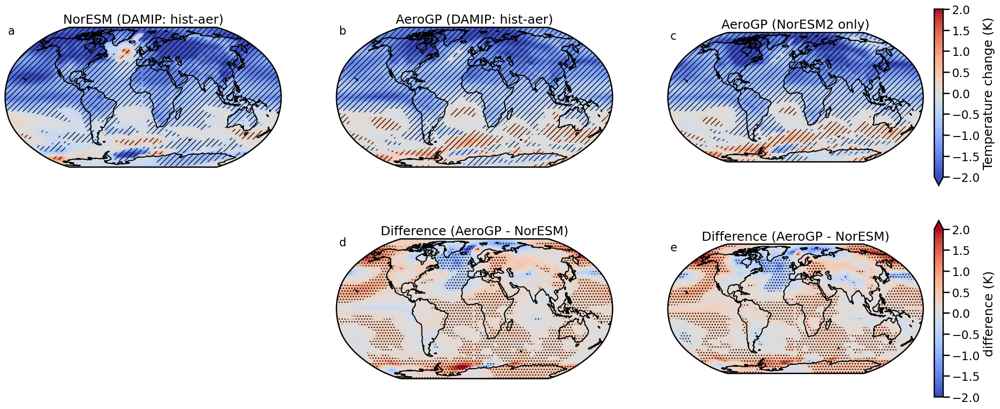

In [20]:
with sns.plotting_context("talk"):
    
    fig = plt.figure(figsize=(24, 10)) 

    plt.subplot(231, projection=proj)
    histaer_NorESM_mean.plot(transform=ccrs.PlateCarree(central_longitude=0.0),cmap="coolwarm", norm=divnorm2, add_colorbar=False)
    #plt.pcolor(ramip_NorESM.lon, ramip_NorESM.lat, hist_pvals.where(hist_pvals<0.05), hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.contourf(ramip_NorESM.lon, ramip_NorESM.lat, histaer_stats['fdr_adjusted_p_values'][0], colors='none', levels=[0,0.05],
                    hatches=['///'], alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='NorESM (DAMIP: hist-aer)')
    plt.gca().set_ylabel('hist-aer')
    plt.gca().annotate('a', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    # Emulator
    plt.subplot(232, projection=proj)
    histaer_AeroGP_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm2, add_colorbar=False)
    plt.pcolor(ramip_NorESM.lon, ramip_NorESM.lat, hist_gp_std.where(np.abs(histaer_AeroGP_mean)>hist_gp_std*0.5), hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='AeroGP (DAMIP: hist-aer)')
    plt.gca().annotate('b', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    # Emulator with only NorESM2
    plt.subplot(233, projection=proj)
    histaer_AeroGP_noresm2_mean.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm2, cbar_kwargs={"label":"Temperature change (K)",'pad':0.04,'fraction':0.035})
    plt.pcolor(ramip_NorESM.lon, ramip_NorESM.lat, histaer2_std.where(np.abs(histaer_AeroGP_noresm2_mean)>histaer2_std*0.5), hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='AeroGP (NorESM2 only)')
    plt.gca().annotate('c', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    # Difference
    plt.subplot(235, projection=proj)
    hist_aer_diff.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm2, add_colorbar=False)
    cs = plt.contourf(ramip_NorESM.lon, ramip_NorESM.lat, p_histdiff, colors='none', levels=[0,0.05],
                    hatches=['...'], alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='Difference (AeroGP - NorESM)')
    plt.gca().annotate('d', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

    plt.subplot(236, projection=proj)
    histaer2_diff.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm2, cbar_kwargs={"label":"difference (K)",'pad':0.04,'fraction':0.035})
    cs = plt.contourf(ramip_NorESM.lon, ramip_NorESM.lat, p_histaerdiff2, colors='none', levels=[0,0.05],
                    hatches=['...'], alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.setp(plt.gca(), title='Difference (AeroGP - NorESM)')
    plt.gca().annotate('e', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=16)

In [21]:
inputs_NorESM2 = xr.open_mfdataset('../training_data_NorESM2/inputs_*.nc',combine='nested',concat_dim='year',preprocess=add_year)
exps2 = np.unique(inputs_NorESM2.experiment)

c:\Users\made2928\OneDrive\Documents\MISU\NorESMem\training_data_NorESM2\inputs_AeroGP1.nc
{'units': 'Tg/yr', 'experiment_id': 'AeroGP1'}
c:\Users\made2928\OneDrive\Documents\MISU\NorESMem\training_data_NorESM2\inputs_AeroGP2.nc
{'units': 'Tg/yr', 'experiment_id': 'AeroGP2'}
c:\Users\made2928\OneDrive\Documents\MISU\NorESMem\training_data_NorESM2\inputs_hist-aer.nc
{'units': 'Tg/yr', 'experiment_id': 'hist-aer'}
c:\Users\made2928\OneDrive\Documents\MISU\NorESMem\training_data_NorESM2\inputs_ramip_af.nc
{'units': 'Tg/yr', 'experiment_id': 'RAMIP AF'}
c:\Users\made2928\OneDrive\Documents\MISU\NorESMem\training_data_NorESM2\inputs_ramip_ea.nc
{'units': 'Tg/yr', 'experiment_id': 'RAMIP EA'}
c:\Users\made2928\OneDrive\Documents\MISU\NorESMem\training_data_NorESM2\inputs_ramip_nae.nc
{'units': 'Tg/yr', 'experiment_id': 'RAMIP NAE'}
c:\Users\made2928\OneDrive\Documents\MISU\NorESMem\training_data_NorESM2\inputs_ramip_sa.nc
{'units': 'Tg/yr', 'experiment_id': 'RAMIP SA'}
c:\Users\made2928\OneD

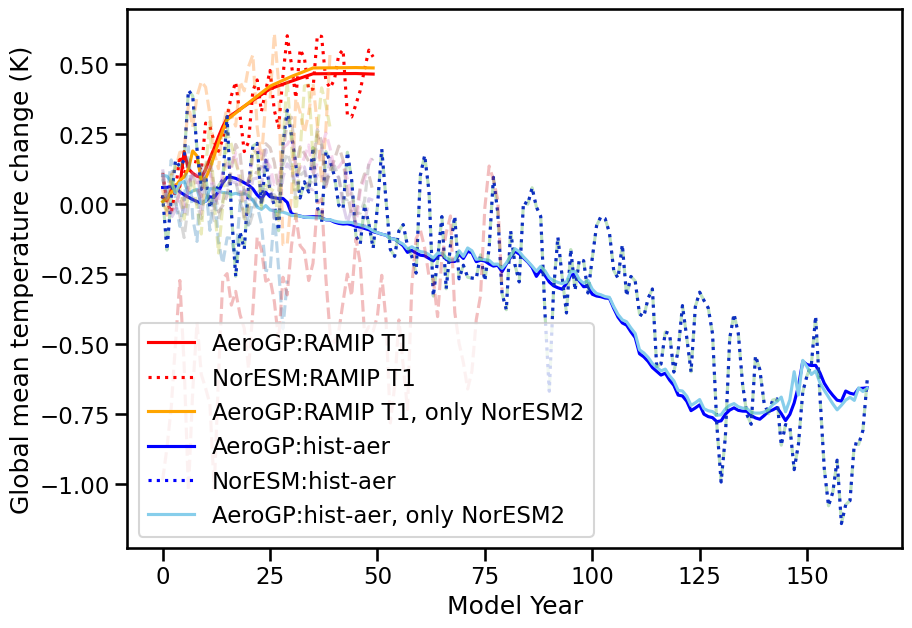

In [22]:
#plot global mean tas comparison:
with sns.plotting_context("talk"):
    plt.figure(figsize=(10,7))
    plt.plot(lat_weighted_mean(ramip_AeroGP['posterior']),color='r')
    plt.plot(lat_weighted_mean(ramip_NorESM['tas_diff']), linestyle=':',color='r')
    plt.plot(lat_weighted_mean(ramip_AeroGP_noresm2['posterior']),color='orange')
    plt.plot(lat_weighted_mean(histaer_AeroGP['posterior']),color='b')
    plt.plot(lat_weighted_mean(histaer_NorESM['tas_diff']),color='b',linestyle=':')
    plt.plot(lat_weighted_mean(histaer_AeroGP_noresm2['posterior']),color='skyblue')
    for ii in exps2:
        if ii == 'RAMIP T1':
            continue
        if ii == 'hist-aer':
            continue
        plt.plot(lat_weighted_mean(outputs_ALL.where(outputs_ALL.experiment==ii, drop=True)['tas_diff']),alpha=0.3, linestyle='--')
    plt.xlabel('Model Year')
    plt.ylabel('Global mean temperature change (K)')
    plt.legend(['AeroGP:RAMIP T1', 'NorESM:RAMIP T1', 'AeroGP:RAMIP T1, only NorESM2', 'AeroGP:hist-aer', 'NorESM:hist-aer','AeroGP:hist-aer, only NorESM2'])

# GP schematic

In [23]:
#define perturbation regions as  [lower_left_lon, lower_left_lat, upper_right_lon, upper_right_lat]
pert_regions = dict([
    ('gb', [0, -90, 360, 90]),
    ('ru', [55, 45, 180, 80]),
    ('ea', [95, -10, 150, 45]),
    ('wa', [60, 0, 95, 45]),
    ('na', [190, 15, 305, 78]),
    ('af', [-25, -40, 60, 45]),
    ('eu', [-20, 45, 55, 80]),
])



def create_predictor_regions(pert_regions, data_set):
    #for given input dataset and coordingates of regions, sum emissions in those regions and return as dataframe.
    #note: emission units are Tg/yr per gridbox (so summing over lat/lon gives Tg/yr for that region) (not fluxes!)
    inputs = pd.DataFrame()
    X = data_set

    #for EU and AF, which cross the maridian, we need to adjust the longitude range to be between -180 and 180
    #make a copy of the dataset and adjust the longitude values:
    X_mod = X.copy()
    X_mod['lon'] = np.mod(X_mod['lon'] + 180, 360) - 180
    X_mod = X_mod.sortby(X_mod.lon)

    for key_region in pert_regions:

        #set up lat/lon slice values:
        lat_slice = slice(pert_regions[key_region][1],pert_regions[key_region][3])
        lon_slice = slice(pert_regions[key_region][0],pert_regions[key_region][2])

        #select from modified dataset if region is 'eu' or 'af':
        if key_region == 'eu' or key_region == 'af':
            Y_SO2 = X_mod['SO2'].sel(lat=lat_slice,lon=lon_slice).sum(('lat','lon')).to_dataframe('SO2')
            Y_SO2 = Y_SO2.add_suffix(key_region)
            inputs = pd.concat([inputs, Y_SO2], axis=1)

            Y_BC = X_mod['BC'].sel(lat=lat_slice,lon=lon_slice).sum(('lat','lon')).to_dataframe('BC')
            Y_BC = Y_BC.add_suffix(key_region)
            inputs = pd.concat([inputs, Y_BC], axis=1)

            Y_OC = X_mod['OC'].sel(lat=lat_slice,lon=lon_slice).sum(('lat','lon')).to_dataframe('OC')
            Y_OC = Y_OC.add_suffix(key_region)
            inputs = pd.concat([inputs, Y_OC], axis=1)
        
        else:       
            Y_SO2 = X['SO2'].sel(lat=lat_slice,lon=lon_slice).sum(('lat','lon')).to_dataframe('SO2')
            Y_SO2 = Y_SO2.add_suffix(key_region)
            inputs = pd.concat([inputs, Y_SO2], axis=1)

            Y_BC = X['BC'].sel(lat=lat_slice,lon=lon_slice).sum(('lat','lon')).to_dataframe('BC')
            Y_BC = Y_BC.add_suffix(key_region)
            inputs = pd.concat([inputs, Y_BC], axis=1)

            Y_OC = X['OC'].sel(lat=lat_slice,lon=lon_slice).sum(('lat','lon')).to_dataframe('OC')
            Y_OC = Y_OC.add_suffix(key_region)
            inputs = pd.concat([inputs, Y_OC], axis=1)

    return inputs

def add_year(ds):
    #add year as a coordinate to the dataset if it doesn't exist (ie for equilibrium runs where year is not a coordinate)
    if 'year' in ds.coords:
        return ds
    else:
        ds = ds.assign_coords(year=9999)
        ds = ds.expand_dims('year')
        return ds

def prep_inputs(in_files):
    #loop over input files and create a dataframe of emissions for each pert region for each year and experiment.
    input_df = pd.DataFrame()

    data = xr.open_mfdataset(in_files, combine='nested', concat_dim='year', preprocess=add_year)

    inputs = create_predictor_regions(pert_regions, data)
    inputs0 = inputs.fillna(0)
    input_df = pd.concat([input_df, inputs0], axis=0)

    return input_df

In [33]:
#get emissions data for plotting example
inputs_example = prep_inputs('../training_data_v2/inputs_hist-aer.nc')

#edit some of the regions for plotting purposes:
from copy import deepcopy
pert_regions_plotting = deepcopy(pert_regions)
pert_regions_plotting['na'] = [-170, 15, -55, 78]
pert_regions_plotting['sa'] = [-90, -60, -30, 15]

#get dictionarys for each species:
pltyear = 2000
so2_plt = {
    'ru': inputs_example.loc[pltyear]['SO2ru'],
    'ea': inputs_example.loc[pltyear]['SO2ea'],
    'wa': inputs_example.loc[pltyear]['SO2wa'],
    'na': inputs_example.loc[pltyear]['SO2na'],
    'af': inputs_example.loc[pltyear]['SO2af'],
    'eu': inputs_example.loc[pltyear]['SO2eu'],
}

bc_plt = {
    'ru': inputs_example.loc[pltyear]['BCru'],
    'ea': inputs_example.loc[pltyear]['BCea'],
    'wa': inputs_example.loc[pltyear]['BCwa'],
    'na': inputs_example.loc[pltyear]['BCna'],
    'af': inputs_example.loc[pltyear]['BCaf'],
    'eu': inputs_example.loc[pltyear]['BCeu'],
}

oc_plt = {
    'ru': inputs_example.loc[pltyear]['OCru'],
    'ea': inputs_example.loc[pltyear]['OCea'],
    'wa': inputs_example.loc[pltyear]['OCwa'],
    'na': inputs_example.loc[pltyear]['OCna'],
    'af': inputs_example.loc[pltyear]['OCaf'],
    'eu': inputs_example.loc[pltyear]['OCeu'],
}

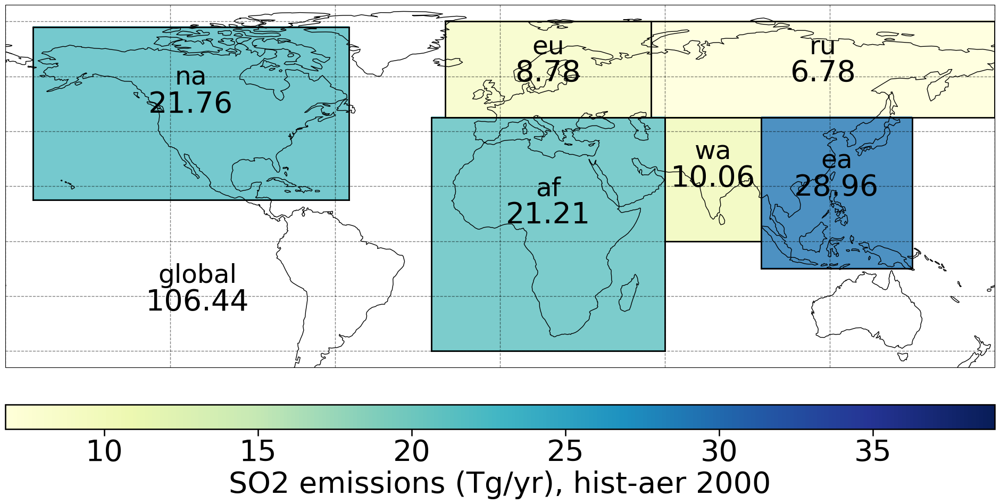

In [34]:
#setup colormap:
values = np.array(list(so2_plt.values()))
norm = plt.Normalize(vmin=min(values), vmax=max(values)+10)
cmap = plt.cm.YlGnBu
colors_plt = {key: cmap(norm(value)) for key, value in so2_plt.items()}

#setup figure:
fig = plt.figure(figsize=(24,18))
# Central map
ax_map = fig.add_subplot(projection=ccrs.PlateCarree())
ax_map.coastlines()
gl = ax_map.gridlines(crs=ccrs.PlateCarree(),linestyle="--", linewidth=1, color='k', alpha=0.5, draw_labels=False)
#gl.ylabel_style = {'size':16, 'color': 'k', 'weight': 'normal'}
#gl.xlabel_style = {'size':16, 'color': 'k', 'weight': 'normal'}
#ax_map.stock_img()

def line_regions(ll_coord, ur_coord):
    c = 'k'
    lw = 2
    tf = ccrs.PlateCarree()
    ax_map.plot([ll_coord[0],ur_coord[0]],[ll_coord[1],ll_coord[1]],transform=tf,color=c,linewidth=lw)
    ax_map.plot([ll_coord[0],ur_coord[0]],[ur_coord[1],ur_coord[1]],transform=tf,color=c,linewidth=lw)
    ax_map.plot([ll_coord[0],ll_coord[0]],[ll_coord[1],ur_coord[1]],transform=tf,color=c,linewidth=lw)
    ax_map.plot([ur_coord[0],ur_coord[0]],[ll_coord[1],ur_coord[1]],transform=tf,color=c,linewidth=lw)

#plot:
with sns.plotting_context('talk'):
    for key_region in pert_regions:
        if key_region == 'gb':
            continue
        else:
            line_regions(pert_regions[key_region][0:2], pert_regions[key_region][2:4])
            ax_map.annotate(key_region, xy=(pert_regions[key_region][0]+(pert_regions[key_region][2]-pert_regions[key_region][0])/2, pert_regions[key_region][3]-(pert_regions[key_region][3]-pert_regions[key_region][1])/3), fontsize=35, ha='center')
            ax_map.annotate(np.round(so2_plt[key_region],decimals=2), xy=(pert_regions[key_region][0]+(pert_regions[key_region][2]-pert_regions[key_region][0])/2, pert_regions[key_region][3]-((pert_regions[key_region][3]-pert_regions[key_region][1])/3)-10), fontsize=40, ha='center')

            #fill each region with emissions:
            ax_map.fill_between([pert_regions_plotting[key_region][0],pert_regions_plotting[key_region][2]],pert_regions_plotting[key_region][1],pert_regions_plotting[key_region][3], color=colors_plt[key_region], alpha=0.8)
    cb=plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax_map, orientation='horizontal',pad=0.05,aspect=40)
    cb.ax.tick_params(labelsize=40)
    cb.set_label('SO2 emissions (Tg/yr), hist-aer 2000', fontsize=40)
    ax_map.annotate('global',xy=(250,-15),fontsize=35,ha='center')
    ax_map.annotate(np.round(inputs_example.loc[pltyear]['SO2gb'],decimals=2), xy=(250,-25), fontsize=40, ha='center')


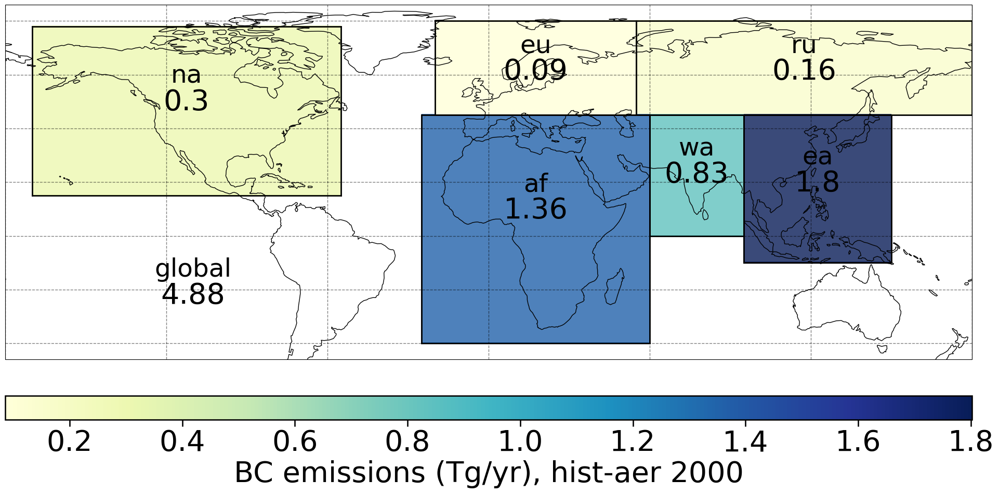

In [35]:
#setup colormap:
values = np.array(list(bc_plt.values()))
norm = plt.Normalize(vmin=min(values), vmax=max(values))
cmap = plt.cm.YlGnBu
colors_plt = {key: cmap(norm(value)) for key, value in bc_plt.items()}

#setup figure:
fig = plt.figure(figsize=(24,18))
# Central map
ax_map = fig.add_subplot(projection=ccrs.PlateCarree())
ax_map.coastlines()
gl = ax_map.gridlines(crs=ccrs.PlateCarree(),linestyle="--", linewidth=1, color='k', alpha=0.5, draw_labels=False)
#gl.ylabel_style = {'size':16, 'color': 'k', 'weight': 'normal'}
#gl.xlabel_style = {'size':16, 'color': 'k', 'weight': 'normal'}
#ax_map.stock_img()

def line_regions(ll_coord, ur_coord):
    c = 'k'
    lw = 2
    tf = ccrs.PlateCarree()
    ax_map.plot([ll_coord[0],ur_coord[0]],[ll_coord[1],ll_coord[1]],transform=tf,color=c,linewidth=lw)
    ax_map.plot([ll_coord[0],ur_coord[0]],[ur_coord[1],ur_coord[1]],transform=tf,color=c,linewidth=lw)
    ax_map.plot([ll_coord[0],ll_coord[0]],[ll_coord[1],ur_coord[1]],transform=tf,color=c,linewidth=lw)
    ax_map.plot([ur_coord[0],ur_coord[0]],[ll_coord[1],ur_coord[1]],transform=tf,color=c,linewidth=lw)

#plot:
with sns.plotting_context('talk'):
    for key_region in pert_regions:
        if key_region == 'gb':
            continue
        else:
            line_regions(pert_regions[key_region][0:2], pert_regions[key_region][2:4])
            ax_map.annotate(key_region, xy=(pert_regions[key_region][0]+(pert_regions[key_region][2]-pert_regions[key_region][0])/2, pert_regions[key_region][3]-(pert_regions[key_region][3]-pert_regions[key_region][1])/3), fontsize=35, ha='center')
            ax_map.annotate(np.round(bc_plt[key_region],decimals=2), xy=(pert_regions[key_region][0]+(pert_regions[key_region][2]-pert_regions[key_region][0])/2, pert_regions[key_region][3]-((pert_regions[key_region][3]-pert_regions[key_region][1])/3)-10), fontsize=40, ha='center')

            #fill each region with emissions:
            ax_map.fill_between([pert_regions_plotting[key_region][0],pert_regions_plotting[key_region][2]],pert_regions_plotting[key_region][1],pert_regions_plotting[key_region][3], color=colors_plt[key_region], alpha=0.8)
    cb=plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax_map, orientation='horizontal',pad=0.05,aspect=40)
    cb.ax.tick_params(labelsize=40)
    cb.set_label('BC emissions (Tg/yr), hist-aer 2000', fontsize=40)
    ax_map.annotate('global',xy=(250,-15),fontsize=35,ha='center')
    ax_map.annotate(np.round(inputs_example.loc[pltyear]['BCgb'],decimals=2), xy=(250,-25), fontsize=40, ha='center')

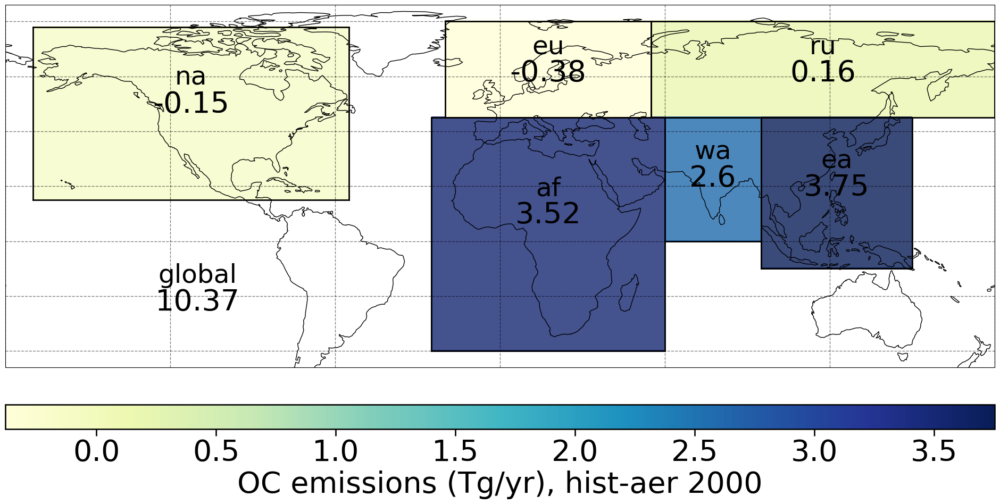

In [36]:
#setup colormap:
values = np.array(list(oc_plt.values()))
norm = plt.Normalize(vmin=min(values), vmax=max(values))
cmap = plt.cm.YlGnBu
colors_plt = {key: cmap(norm(value)) for key, value in oc_plt.items()}

#setup figure:
fig = plt.figure(figsize=(24,18))
# Central map
ax_map = fig.add_subplot(projection=ccrs.PlateCarree())
ax_map.coastlines()
gl = ax_map.gridlines(crs=ccrs.PlateCarree(),linestyle="--", linewidth=1, color='k', alpha=0.5, draw_labels=False)
#gl.ylabel_style = {'size':16, 'color': 'k', 'weight': 'normal'}
#gl.xlabel_style = {'size':16, 'color': 'k', 'weight': 'normal'}
#ax_map.stock_img()

def line_regions(ll_coord, ur_coord):
    c = 'k'
    lw = 2
    tf = ccrs.PlateCarree()
    ax_map.plot([ll_coord[0],ur_coord[0]],[ll_coord[1],ll_coord[1]],transform=tf,color=c,linewidth=lw)
    ax_map.plot([ll_coord[0],ur_coord[0]],[ur_coord[1],ur_coord[1]],transform=tf,color=c,linewidth=lw)
    ax_map.plot([ll_coord[0],ll_coord[0]],[ll_coord[1],ur_coord[1]],transform=tf,color=c,linewidth=lw)
    ax_map.plot([ur_coord[0],ur_coord[0]],[ll_coord[1],ur_coord[1]],transform=tf,color=c,linewidth=lw)

#plot:
with sns.plotting_context('talk'):
    for key_region in pert_regions:
        if key_region == 'gb':
            continue
        else:
            line_regions(pert_regions[key_region][0:2], pert_regions[key_region][2:4])
            ax_map.annotate(key_region, xy=(pert_regions[key_region][0]+(pert_regions[key_region][2]-pert_regions[key_region][0])/2, pert_regions[key_region][3]-(pert_regions[key_region][3]-pert_regions[key_region][1])/3), fontsize=35, ha='center')
            ax_map.annotate(np.round(oc_plt[key_region],decimals=2), xy=(pert_regions[key_region][0]+(pert_regions[key_region][2]-pert_regions[key_region][0])/2, pert_regions[key_region][3]-((pert_regions[key_region][3]-pert_regions[key_region][1])/3)-10), fontsize=40, ha='center')

            #fill each region with emissions:
            ax_map.fill_between([pert_regions_plotting[key_region][0],pert_regions_plotting[key_region][2]],pert_regions_plotting[key_region][1],pert_regions_plotting[key_region][3], color=colors_plt[key_region], alpha=0.8)
    cb=plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax_map, orientation='horizontal',pad=0.05,aspect=40)
    cb.ax.tick_params(labelsize=40)
    cb.set_label('OC emissions (Tg/yr), hist-aer 2000', fontsize=40)
    ax_map.annotate('global',xy=(250,-15),fontsize=35,ha='center')
    ax_map.annotate(np.round(inputs_example.loc[pltyear]['OCgb'],decimals=2), xy=(250,-25), fontsize=40, ha='center')

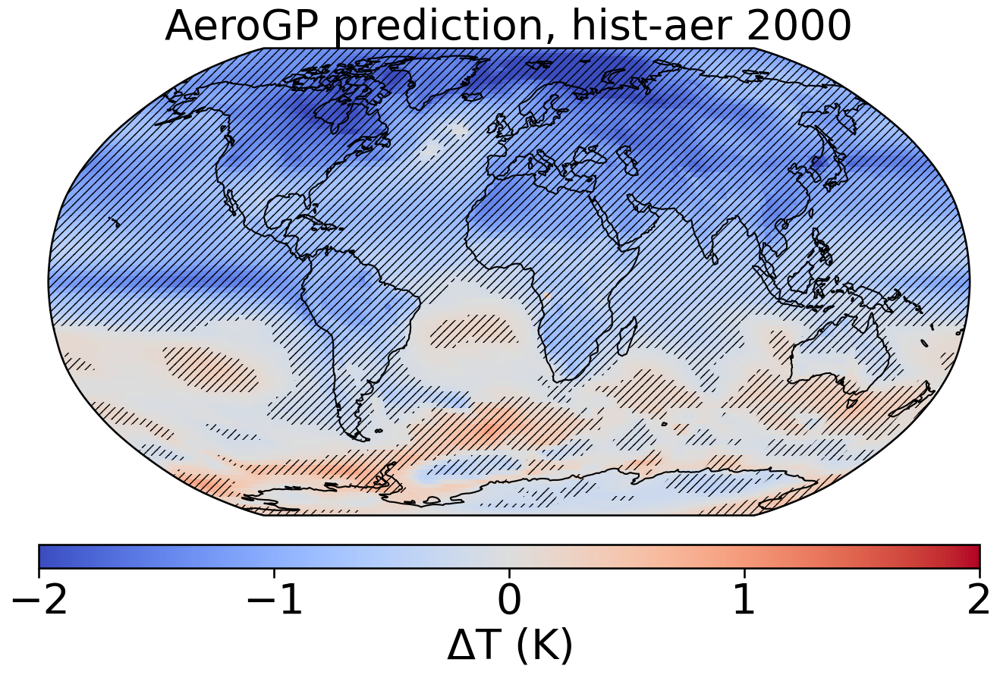

In [37]:
#example prediction:
#select years:
histaer_AeroGP_plt = histaer_AeroGP['posterior'].sel(year=pltyear)

#standard deviation of AeroGP:
hist_gp_std = histaer_AeroGP['posterior std'].sel(year=pltyear)

proj = ccrs.Robinson()
divnorm = colors.TwoSlopeNorm(vmin=-2., vcenter=0., vmax=2.)

with sns.plotting_context("talk"):
    fig = plt.figure(figsize=(16, 10))

    # Emulator
    ax=plt.subplot(projection=proj)
    histaer_AeroGP_plt.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm, add_colorbar=False)
    plt.pcolor(ramip_NorESM.lon, ramip_NorESM.lat, hist_gp_std.where(np.abs(histaer_AeroGP_plt)>hist_gp_std*0.5), hatch='///', alpha=0., transform=ccrs.PlateCarree())
    plt.gca().coastlines()
    plt.gca().set_title('AeroGP prediction, hist-aer 2000',fontdict={'fontsize':40})
    cb=plt.colorbar(plt.cm.ScalarMappable(norm=divnorm, cmap="coolwarm"), ax=ax, orientation='horizontal',pad=0.05,aspect=40)
    cb.ax.tick_params(labelsize=40)
    cb.set_label("$\Delta$T (K)", fontsize=40)



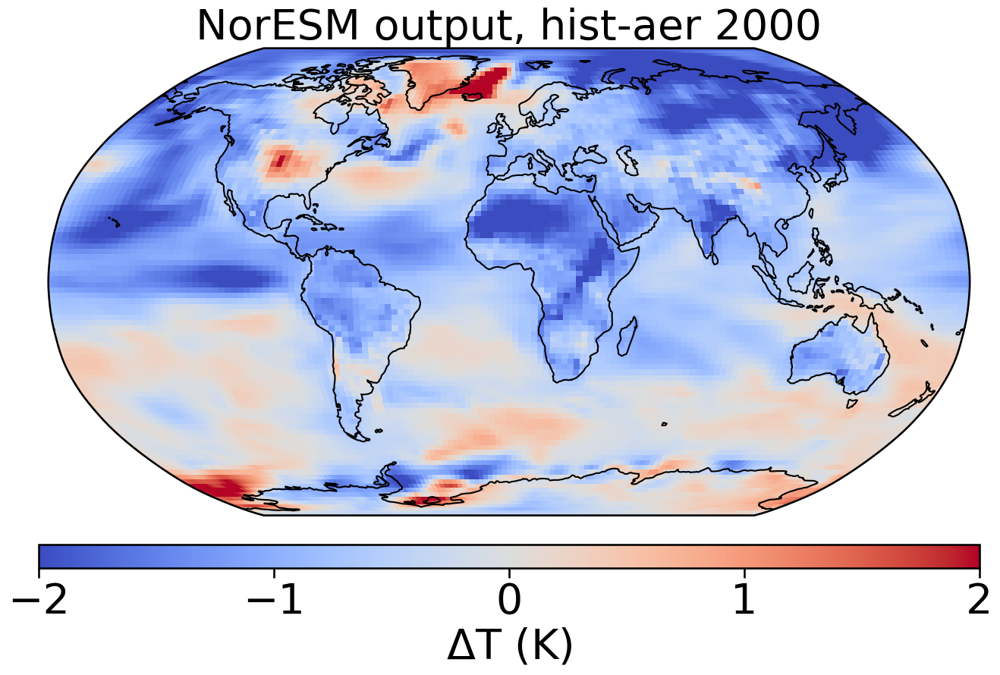

In [7]:
#example output
histaer_NorESM_plt = histaer_NorESM['tas_diff'].sel(year=2000)

proj = ccrs.Robinson()
divnorm = colors.TwoSlopeNorm(vmin=-2., vcenter=0., vmax=2.)

with sns.plotting_context("talk"):
    fig = plt.figure(figsize=(16, 10))

    ax=plt.subplot(projection=proj)
    histaer_NorESM_plt.plot(transform=ccrs.PlateCarree(), cmap="coolwarm", norm=divnorm, add_colorbar=False)

    plt.gca().coastlines()
    plt.gca().set_title('NorESM output, hist-aer 2000',fontdict={'fontsize':40})
    cb=plt.colorbar(plt.cm.ScalarMappable(norm=divnorm, cmap="coolwarm"), ax=ax, orientation='horizontal',pad=0.05,aspect=40)
    cb.ax.tick_params(labelsize=40)
    cb.set_label("$\Delta$T (K)", fontsize=40)